In [1]:
import keggpathx as kp

import pandas as pd

import networkx as nx
import matplotlib.pyplot as plt
import numpy as np


import os
#from pymnet import *


In [2]:
org=[['sai','01100'],['tac','01100'],['eco','01040'],['hsa','01040'],['ptr','01040'],['ath','01040'],['mmu','01040'],['cac','01100'],['cel','01040'],['dme','01040'],['lma','01040'],['sce','01040'],['sfx','01040']]

In [3]:
for i in org:
    locals()['G_'+str(i[0])], locals()['NODOS_'+str(i[0])], locals()['EDGES_'+str(i[0])] =kp.net_label(i[0],i[1])   

In [5]:
# len(list(nx.simple_cycles(G_sai)))

In [ ]:
# len(list(nx.simple_cycles(G_hsa)))

In [7]:
Tabla=[]   
for i in org:
    Nombre=i[0]
    N_nodos = nx.number_of_nodes(locals()['G_'+str(i[0])])
    N_edges = nx.number_of_edges(locals()['G_'+str(i[0])])
    densidad= 2*N_edges/(N_nodos*(N_nodos-1))
    reciprocidad= nx.reciprocity(locals()['G_'+str(i[0])])
    asortatividad= nx.degree_assortativity_coefficient(locals()['G_'+str(i[0])])
    grado_promedio=N_edges/N_nodos
    
    
    #grado_promedio = [suma += locals()['G_'+str(i[0])].in_degree for x in G.nodes ]
    
    inter_grupo=kp.group_betweenness(locals()['G_'+str(i[0])])
    cerc_grupo=kp.group_cerc(locals()['G_'+str(i[0])])
    transitividad=nx.transitivity(locals()['G_'+str(i[0])])
    cluster_promedio=nx.average_clustering(locals()['G_'+str(i[0])].to_undirected(), nodes=None)    
    
    
    
    Tabla.append([Nombre, 
                  N_nodos,
                  N_edges,
                  grado_promedio,
                  densidad,
                  reciprocidad,
                  asortatividad,
                  inter_grupo,
                  cerc_grupo,
                  transitividad,
                  cluster_promedio])
        
    
tabla=pd.DataFrame(Tabla,columns=['Nombre',
                               'N_nodos',
                               'N_edges',
                               'grado_promedio',
                               'densidad',
                               'reciprocidad',
                               'asortatividad',
                               'intermediacion_grupo',
                               'cercania_grupo',
                               'transitividad',
                               'cluster_promedio'])

tabla.sort_values(by='N_nodos', ascending=False)

,Nombre,N_nodos,N_edges,grado_promedio,densidad,reciprocidad,asortatividad,intermediacion_grupo,cercania_grupo,transitividad,cluster_promedio
4,ptr,811,3059,3.771887,0.009313,0.264139,0.239629,0.082719,0.159345,0.278135,0.431662
3,hsa,803,3066,3.818182,0.009522,0.270059,0.240585,0.080188,0.159407,0.274731,0.427219
6,mmu,796,2953,3.709799,0.009333,0.263461,0.209955,0.084099,0.156519,0.275359,0.423773
5,ath,787,2069,2.628971,0.006689,0.245529,0.262880,0.077624,0.102513,0.263467,0.392950
2,eco,682,1811,2.655425,0.007799,0.192159,0.313523,0.083856,0.127802,0.250179,0.343522
12,sfx,610,1547,2.536066,0.008329,0.188752,0.272465,0.066824,0.137226,0.244448,0.323018
9,dme,522,1437,2.752874,0.010568,0.268615,0.237661,0.089915,0.144918,0.239993,0.361672
11,sce,495,1253,2.531313,0.010248,0.252195,0.290489,0.074379,0.127624,0.264965,0.336716
8,cel,483,1373,2.842650,0.011795,0.268026,0.267403,0.067334,0.162839,0.261595,0.350546
7,cac,414,877,2.118357,0.010258,0.216648,0.359466,0.059443,0.115749,0.236584,0.287451


# ACP 

Liberias necesarias

In [8]:
import chart_studio.plotly as py
from plotly.graph_objs import*
import  chart_studio.tools as tls
tls.set_credentials_file(username = 'FranciscoRLanza' , api_key = 'PStI18FoFKgpLSIMwXh3' )
from sklearn.preprocessing import StandardScaler 
from sklearn.decomposition import PCA as sk_acp     

In [15]:
y

array(['sai', 'tac', 'eco', 'hsa', 'ptr', 'ath', 'mmu', 'cac', 'cel',
       'dme', 'lma', 'sce', 'sfx'], dtype=object)

In [9]:
X=tabla.iloc[:,1:11].values
y=tabla.iloc[:,0].values
X_std=StandardScaler().fit_transform(X)
acp=sk_acp(n_components=4)
Y=acp.fit_transform(X_std)
results=[]

for name in ('sai', 'tac', 'eco', 'hsa', 'ptr', 'ath', 'mmu', 'cac', 'cel','dme', 'lma', 'sce', 'sfx'):
    result= Scatter(x = Y[y==name,0] , y=Y[y==name,1], 
                   mode= 'markers', name=name,
                   marker = Marker( size=15 , line=Line(color='rgba(225,225,225,0.2)',width=0.5), 
                                  opacity= 0.75 ))
    results.append(result)
    
data=Data(results)
layout=Layout(xaxis=XAxis(title='CP1', showline=False), yaxis=YAxis(title='CP2', showline=False) )

fig = Figure(data=data , layout= layout)
py.iplot(fig)

C:\Users\Francisco R laza\Anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning: plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.

  DeprecationWarning,
C:\Users\Francisco R laza\Anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:441: DeprecationWarning: plotly.graph_objs.Marker is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Marker
  - plotly.graph_objs.histogram.selected.Marker
  - etc.

  DeprecationWarning,
C:\Users\Francisco R laza\Anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:40: DeprecationWarning: plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
 

In [28]:
tabla.sort_values(by='grado_promedio', ascending=False)

,Nombre,N_nodos,N_edges,grado_promedio,densidad,reciprocidad,asortatividad,inter_grupo,cerc_grupo,transitividad,cluster_promedio
3,hsa,865,3213,3.714451,0.008598,0.245876,0.199561,0.072099,0.144419,0.275067,0.430816
4,ptr,867,3178,3.665513,0.008465,0.244808,0.195785,0.074517,0.145237,0.275256,0.427809
6,mmu,848,3037,3.581368,0.008457,0.240369,0.202522,0.079038,0.144517,0.274527,0.423447
8,cel,494,1381,2.795547,0.011341,0.260681,0.267266,0.061610,0.159074,0.261286,0.347343
9,dme,542,1455,2.684502,0.009924,0.252921,0.214352,0.082241,0.142970,0.241026,0.356565
2,eco,710,1853,2.609859,0.007362,0.183486,0.290119,0.079924,0.129616,0.246461,0.332568
5,ath,826,2127,2.575061,0.006243,0.220028,0.259288,0.062618,0.096055,0.259215,0.391388
11,sce,502,1267,2.523904,0.010075,0.244672,0.280264,0.071957,0.126124,0.265774,0.334522
12,sfx,626,1574,2.514377,0.008046,0.184244,0.248030,0.085244,0.139708,0.240832,0.316399
7,cac,417,879,2.107914,0.010134,0.216155,0.357278,0.060597,0.114950,0.234671,0.285511


In [38]:
suma=0
N_nodos = nx.number_of_nodes(G_ptr)
grado_promedio_in = sum([  G_ptr.degree(x) for x in G_ptr.nodes ])/N_nodos

In [ ]:
grado_promedio_in = sum([  G_ptr.degree(x) for x in G_ptr.nodes ])/N_nodos

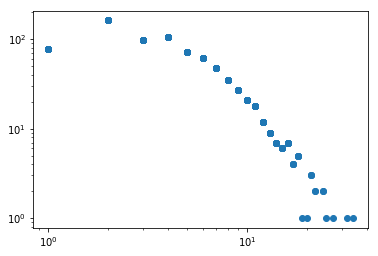

In [71]:
#%%timeit -n 1
G=G_ath
X=[ G.out_degree(x)- G.in_degree(x) for x in G.nodes ]
Y=[ G.out_degree(x)+ G.in_degree(x) for x in G.nodes ]

cont=[ Y.count(i) for i in Y ]

plt.xscale('log') 
plt.yscale('log') 
#plt.plot(X,Y,'o')
plt.plot(Y,cont,'o')

In [1]:
#df.sort_values(by='cluster_promedio', ascending=False)

In [2]:
#df.sort_values(by='asortatividad', ascending=True)

In [6]:
#for i in org:
#Cluster=nx.triangles(G_eco.to_undirected(), nodes=None)
#df=pd.DataFrame(triangle)
#Cluster= pd.DataFrame([[key, Cluster[key]] for key in Cluster.keys()], columns=['Name', 'Coeff_Clusterin'])
#print(Cluster.sort_values(by='Coeff_Clusterin', ascending=False))

In [7]:
#for i in org:
#Cluster=nx.triangles(G_mmu.to_undirected(), nodes=None)
#df=pd.DataFrame(triangle)
#Cluster= pd.DataFrame([[key, Cluster[key]] for key in Cluster.keys()], columns=['Name', 'Coeff_Clusterin'])
#print(Cluster.sort_values(by='Coeff_Clusterin', ascending=False))

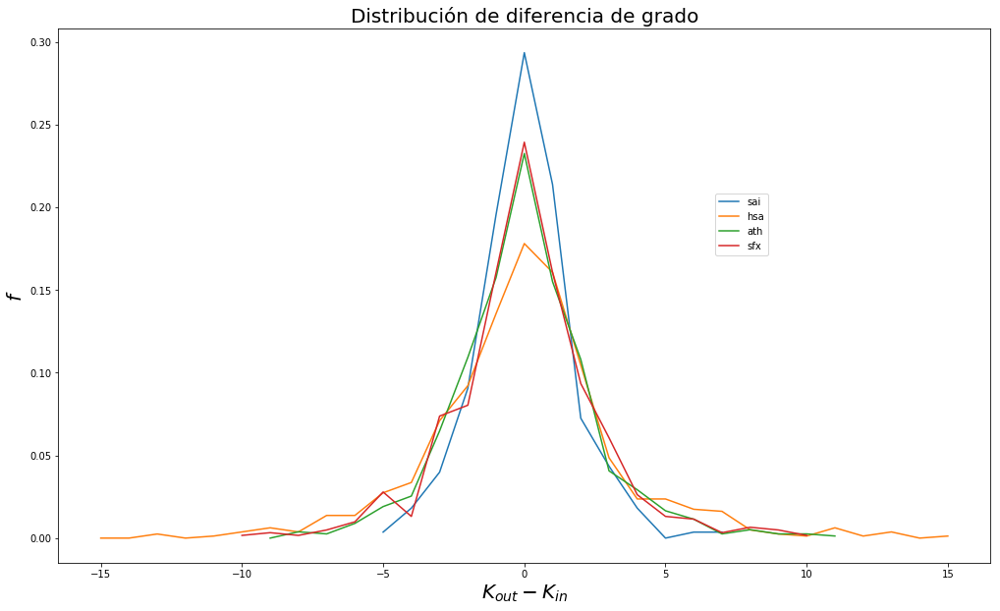

In [102]:
org=[['sai','01100'],
     #['tac','01100'],
     #['eco','01040'],
     ['hsa','01040'],
     #['ptr','01040'],
     ['ath','01040'],
     #['mmu','01040'],
     #['cac','01100'],
     #['cel','01040'],
     #['dme','01040'],
     #['lma','01040'],
     #['sce','01040'],
     ['sfx','01040']]


plt.figure(3,figsize=(17,10))
for j in org:
    G=locals()['G_'+str(j[0])]
    nodos=G.nodes

    D=[] #
    d_in=G.in_degree(G)
    d_out=G.out_degree(G)
    for i in nodos: 
        D.append(d_out(i)-d_in(i))
    
    
    P=[]
    X=[]
    for i in range(min(D)+1,max(D)+1):
        P.append(D.count(i)/len(D))
        X.append(i)


    plt.plot(X,P,label= j[0], antialiased= True)
    
    

plt.title('Distribución de diferencia de grado',fontsize=20)
#plt.figure(3,figsize=(100,100))
plt.xlabel(r'$K_{out}-K_{in}$',fontsize=20)
plt.ylabel(r'$f$',fontsize=20)
plt.legend(bbox_to_anchor=(0.7, 0.7), loc='upper left', borderaxespad=0.5)

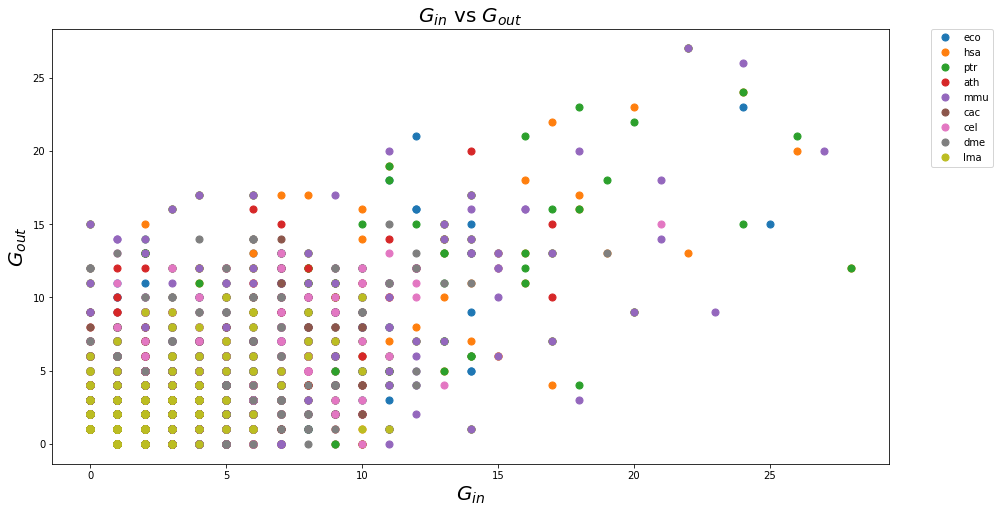

In [23]:
plt.figure(3,figsize=(15,8))
for j in org:
    G=locals()['G_'+str(j[0])]
    nodos=G.nodes

    X=[]
    Y=[]
    d_in=G.in_degree(G)
    d_out=G.out_degree(G)
    for i in nodos: 
        X.append(d_in[i])
        Y.append(d_out(i))
    
    plt.plot(X,Y,'o',label= j[0], markersize=np.sqrt(50)) 


#plt.xscale('log') 
#plt.yscale('log') 
plt.title(r'$G_{in}$ vs $G_{out}$',fontsize=20)    
plt.xlabel(r'$G_{in}$',fontsize=20)
plt.ylabel(r'$G_{out}$',fontsize=20)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)    
    

<Figure size 1080x576 with 0 Axes>

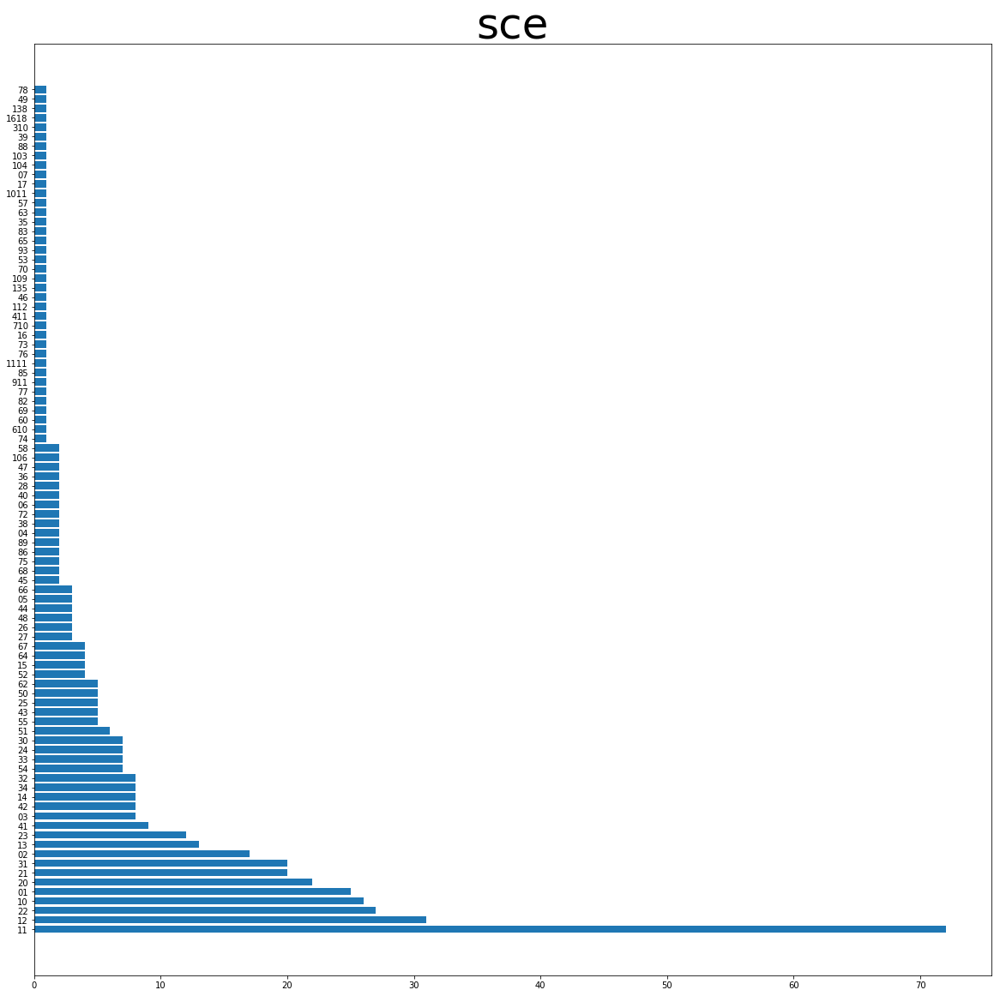

In [18]:
G=G_sce
nodos=G.nodes
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
size1=[]

for i in nodos:
    size.append(str(d_in[i])+str(d_out(i)))
    size1.append([d_in[i],d_out[i]])
plt.figure(3,figsize=(15,8))


Cont=[]
for n in size1:
    S=size1.count( [n[0],n[1]] )
    Cont.append(S)
    #plt.plot(n[0],n[1],'o', markersize=S, c='g')

#print(Cont)    
df1=pd.DataFrame(Cont)
df2=pd.DataFrame(size)
#print(size)

#df1['n']=size

#size1

#df1

df2['cont']=Cont

df2

TT=df2.drop_duplicates(subset = 0)

TT[0].values
#df2#.drop_duplicates()
#df1#.drop_duplicates()

#vdf2=[]
#for i in df2.values:
#    vdf2.append(i[0])

#pd.DataFrame(vdf2)    
#d1['n']=vdf2



TTT=TT.sort_values(by='cont', ascending=False)

from matplotlib import colors

normdata = colors.Normalize(min(TT['cont'].values), max(TT['cont'].values))
colormap = plt.get_cmap("Blues")
colores =colormap(normdata(TT['cont'].values))


#plt.pie(TT['cont'].values, labels=TT[0].values )#,  autopct="%0.1f %%" , colors=colores)
plt.figure(figsize=(20,20))
# plt.pie(TT['cont'].values, labels=TT[0].values , colors=colores)
#plt.pie(TT['cont'].values, labels=TT[0].values , autopct="%0.1f %%" , colors=colores)
plt.barh(TTT[0].values,TTT['cont'].values)
plt.title('sce', size=50)
# plt.savefig('sce')
plt.show()



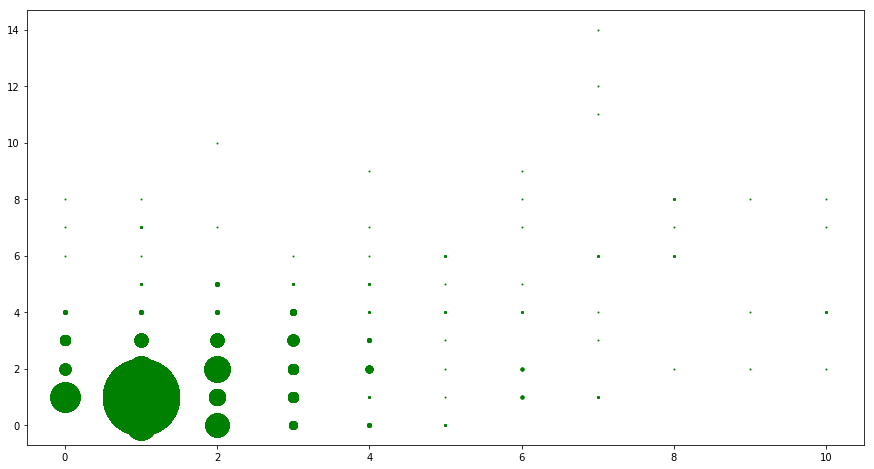

In [38]:
G=G_cac
nodos=G.nodes
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
for i in nodos:
    size.append([d_in[i],d_out(i)])

plt.figure(3,figsize=(15,8))


for n in size:
    S=size.count([n[0],n[1]])
    plt.plot(n[0],n[1],'o', markersize=S, c='g')

plt.show()

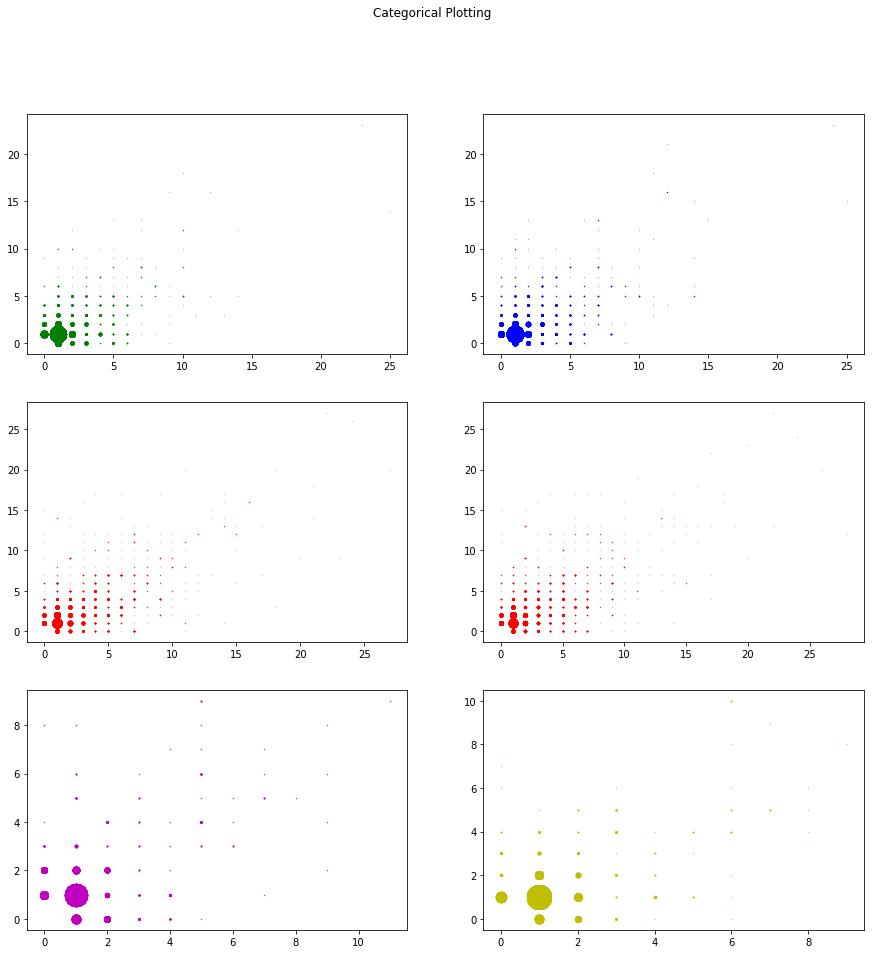

In [7]:
plt.figure(3,figsize=(15,15))

plt.subplot(321)
G=G_sfx
nodos=G.nodes
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
for i in nodos:
    size.append([d_in[i],d_out(i)])
for n in size:
    S=size.count([n[0],n[1]])
    plt.plot(n[0],n[1],'o', markersize=S*100/len(size), c='g')


plt.subplot(322)
G=G_eco
nodos=G.nodes
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
for i in nodos:
    size.append([d_in[i],d_out(i)])
for n in size:
    S=size.count([n[0],n[1]])
    plt.plot(n[0],n[1],'o', markersize=S*100/len(size), c='b')

    
plt.subplot(323)
G=G_mmu
nodos=G.nodes
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
for i in nodos:
    size.append([d_in[i],d_out(i)])
for n in size:
    S=size.count([n[0],n[1]])
    plt.plot(n[0],n[1],'o', markersize=S*100/len(size), c='r')

plt.subplot(324)
G=G_hsa
nodos=G.nodes
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
for i in nodos:
    size.append([d_in[i],d_out(i)])
for n in size:
    S=size.count([n[0],n[1]])
    plt.plot(n[0],n[1],'o', markersize=S*100/len(size), c='r')

    
plt.subplot(325)
G=G_tac
nodos=G.nodes
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
for i in nodos:
    size.append([d_in[i],d_out(i)])
for n in size:
    S=size.count([n[0],n[1]])
    plt.plot(n[0],n[1],'o', markersize=S*100/len(size), c='m')

        
plt.subplot(326)
G=G_sai
nodos=G.nodes
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
for i in nodos:
    size.append([d_in[i],d_out(i)])
for n in size:
    S=size.count([n[0],n[1]])
    plt.plot(n[0],n[1],'o', markersize=S*100/len(size), c='y')

            
#plt.subplot(133)
#plt.plot(names, values)
plt.suptitle('Categorical Plotting')
plt.show()


112


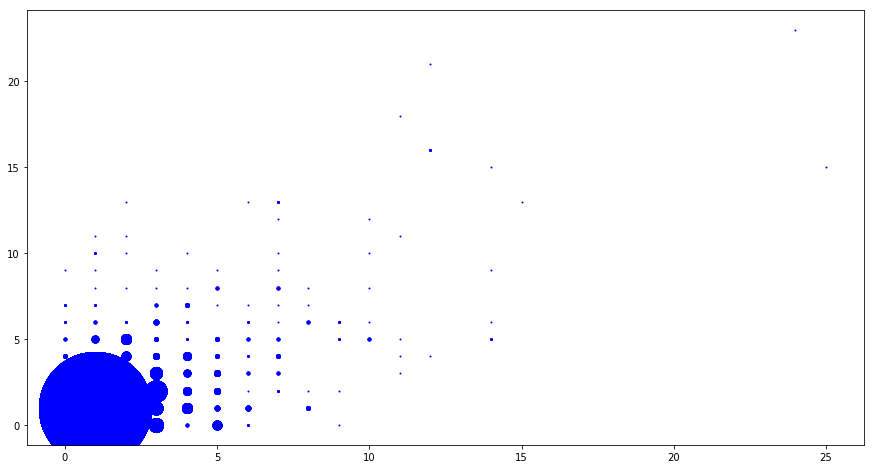

In [37]:
G=G_eco
nodos=G.nodes
X=[]
Y=[]
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
for i in nodos:
    X.append(d_in[i])
    Y.append(d_out(i))
    size.append([d_in[i],d_out(i)])


print(size.count([1,1]))

plt.figure(3,figsize=(15,8))
for n in size:
    S=size.count([n[0],n[1]])
    plt.plot(n[0],n[1],'o', markersize=S, c='b')

plt.show()

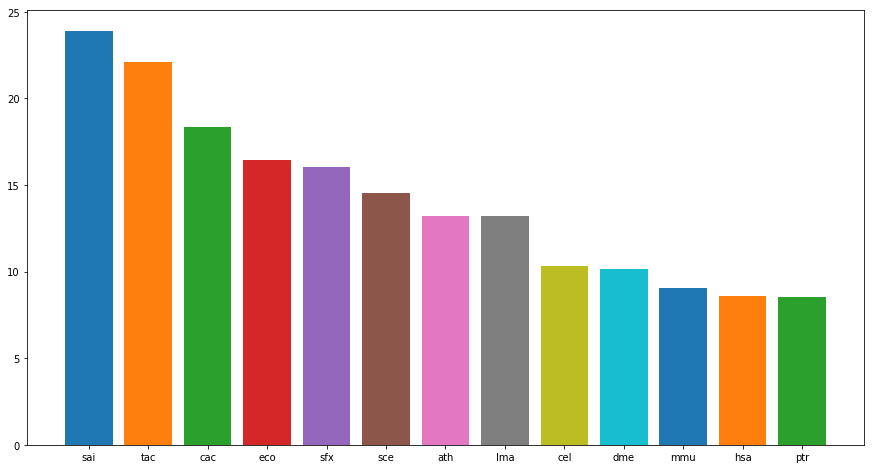

In [11]:
plt.figure(3,figsize=(15,8))
orde=[]
for j in org:
    G=locals()['G_'+str(j[0])]
    nodos=G.nodes
    size=[]
    d_in=G.in_degree(G)
    d_out=G.out_degree(G)
    for i in nodos:
        size.append([d_in[i],d_out(i)])


    prom=size.count([1,1])/len(size)*100
    orde.append([j[0],prom])
    

df=pd.DataFrame(orde)
orde=df.sort_values(by=1, ascending=False)
orde.values

for i in orde.values:
    plt.bar(i[0],i[1])

    
plt.show()    
        


Entropia respecto a la probabilidad de encontrar ciertas tuplas. 

In [12]:
H=[]
for j in org:
    G=locals()['G_'+str(j[0])]
    nodos=G.nodes
    size=[]
    d_in=G.in_degree()
    d_out=G.out_degree()
    for i in nodos:
        size.append(str( [d_in[i],d_out(i)] )  )
    p=[[ i ,size.count(i)] for i in size ]
    df=pd.DataFrame(p, columns=['tuplas','cont'])   
    df=df.drop_duplicates(subset = 'tuplas')
    #print(j[0] ,len(df), len(nodos) , len(df)/len(nodos)*100 )
    df['p']=df['cont']/len(nodos)
    df['H']=-df['p']*np.log2(df['p'])
    suma=df['H'].sum()
    H.append([ j[0] , suma , len(nodos)] )        


In [6]:
#df['H'].sum()
#df.sort_values(by='cont', ascending=False)

In [13]:
E=pd.DataFrame(H , columns=['org','H' , 'N_nodos'] )
E.sort_values(by='H', ascending=False)
#table.sort_values(by='N_nodos', ascending=False)


,org,H,N_nodos
3,hsa,6.289381,803
4,ptr,6.248138,811
6,mmu,6.197750,796
8,cel,5.577313,483
5,ath,5.513961,787
9,dme,5.467035,522
2,eco,5.420440,682
11,sce,5.340530,495
12,sfx,5.329542,610
7,cac,4.887961,414


In [29]:
df.to_csv('eee', sep= ';' )

In [21]:
len(G.nodes)

865

78
77


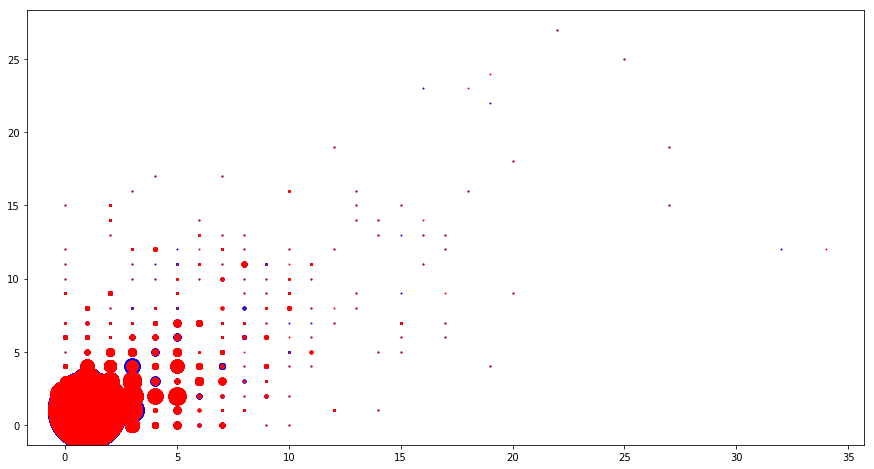

In [17]:



G=G_ptr
nodos=G.nodes
X=[]
Y=[]
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
for i in nodos:
    X.append(d_in[i])
    Y.append(d_out(i))
    size.append([d_in[i],d_out(i)])


print(size.count([1,1]))

plt.figure(3,figsize=(15,8))
for n in size:
    S=size.count([n[0],n[1]])
    plt.plot(n[0],n[1],'o', markersize=S, c='b')



G=G_hsa
nodos=G.nodes
X=[]
Y=[]
size=[]
d_in=G.in_degree(G)
d_out=G.out_degree(G)
for i in nodos:
    X.append(d_in[i])
    Y.append(d_out(i))
    size.append([d_in[i],d_out(i)])


print(size.count([1,1]))

plt.figure(3,figsize=(15,8))
for n in size:
    S=size.count([n[0],n[1]])
    plt.plot(n[0],n[1],'o', markersize=S, c='r')




    
plt.show()

In [18]:
G=G_cac

d=G.degree(G) #Vector con el par ordenado de numero de aristas de entrada a cada uno de los nodos
d_in=G.in_degree(G)
d_out=G.out_degree(G)
degre=[]

for i in G.nodes:
    degre.append([i,d[i],str(d_in[i])+str(d_out[i]), d_in[i]-d_out[i] ])
df=pd.DataFrame(degre,columns=['Nombre', 'grado', 'grado_in' 'grado_out','dif_grado'])
ac=df.sort_values(by='dif_grado', ascending=False)
ac[ac['Nombre'] == 'enolase [EC:4.2.1.11]'].index.values[0]
ac['n'] = 1
ac

n=[]
suma=0
for i in range(0,len(ac)):
    suma=1+suma
    n.append(suma)

ac['n']=n 
ac

ac[ac['Nombre'] == 'enolase [EC:4.2.1.11]'].values[0]



array(['enolase [EC:4.2.1.11]', 4, '31', 2, 59], dtype=object)

## FUNCION IMPORTANTE (Posicion enzima)

In [43]:
kp.enz_position_dfinout(G_hsa,'enolase [EC:4.2.1.11]')

2

In [44]:
kp.enz_position_inter(G_hsa,'enolase [EC:4.2.1.11]')

0.005139489656544398

In [5]:
G=G_hsa
d=G.degree(G) #Vector con el par ordenado de numero de aristas de entrada a cada uno de los nodos
d_in=G.in_degree(G)
d_out=G.out_degree(G)
degre=[]

for i in G.nodes:
    degre.append([i,d[i],d_in[i],d_out[i], d_in[i]-d_out[i] ])

df=pd.DataFrame(degre,columns=['Nombre', 'grado', 'grado_in', 'grado_out','dif_grado'])
ac=df.sort_values(by='dif_grado', ascending=False)
#ac[ac['Nombre'] == 'enolase [EC:4.2.1.11]'].index.values[0]
#ac['n'] = 1
    

n=[]
suma=0
for i in range(0,len(ac)):
    suma=1+suma
    n.append(suma)

ac['n']=n 

name_enzima='enolase [EC:4.2.1.11]'
num=ac[ac['Nombre'] == name_enzima ].values[0][5]

print(num)




167


In [18]:
intr=nx.betweenness_centrality(G) #dicionario en python
intr = pd.DataFrame([[key, intr[key]] for key in intr.keys()], columns=['Nombre', 'intermediacion'])
intr=intr.sort_values(by='intermediacion', ascending=False)

n=[]
suma=0
for i in range(0,len(ac)):
    suma=1+suma
    n.append(suma)

intr['n']=n 
num=intr[intr['Nombre'] == name_enzima ].values[0][2]
print(num)

133


In [4]:
kp.enz_position_inter(G_hsa,'enolase [EC:4.2.1.11]')

133

In [5]:
#G = nx.icosahedral_graph()
#node_cut = nx.minimum_node_cut(G_hsa.to_undirected())
#len(node_cut)
#nx.draw(G)

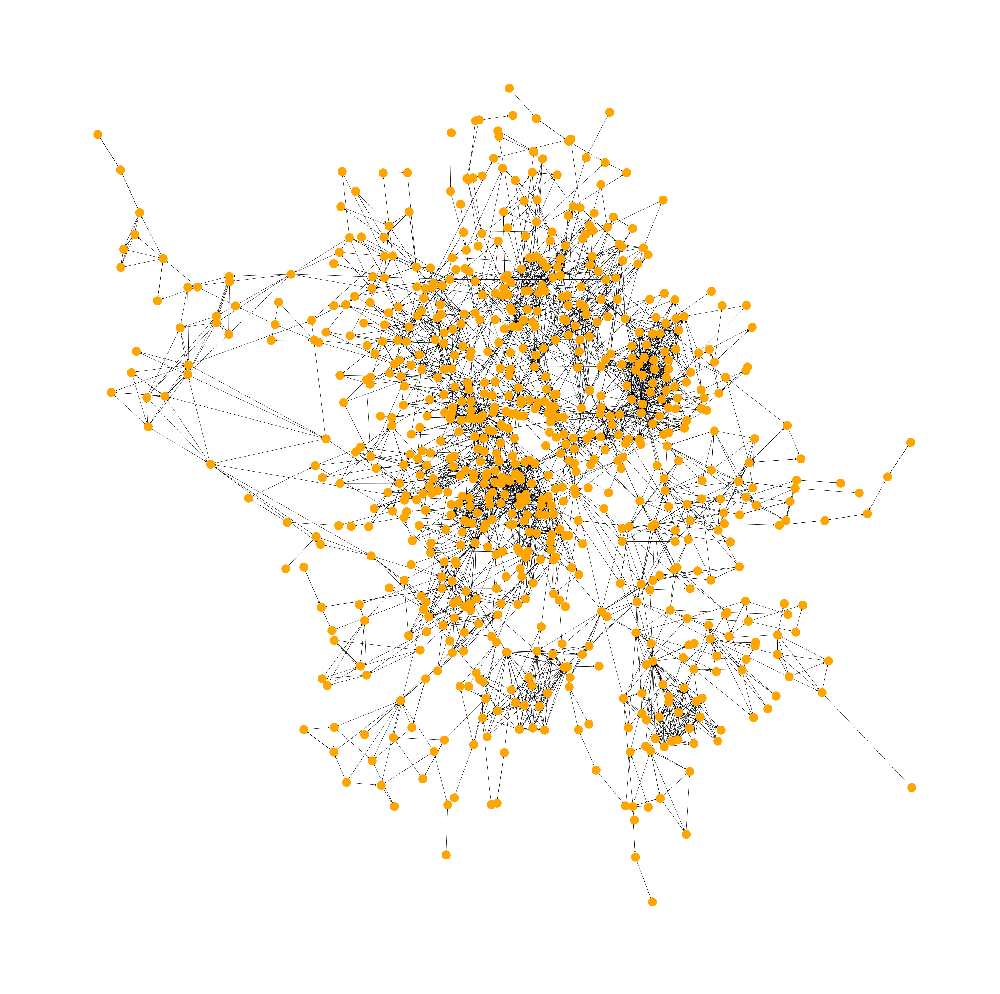

In [93]:
#nx.draw(G_hsa.to_undirected())
plt.figure(3,figsize=(50,50))
nx.draw_kamada_kawai(G_hsa,font_size=15,node_size=1000,node_color='orange',with_labels=False)

In [72]:
#net = models.er_multilayer(10,2,0.1)
#fig = draw(net)

In [15]:
mnet = MultilayerNetwork(aspects=1)
mnet.add_node(1)
mnet.add_layer('a')

mnet[1,'a'].deg()
mnet[1,2,'a','b'] = 1
mnet[1,'a'][2,'b'] = 1
list(mnet[1,'a'])
#fig = draw(mnet)

[(2, 'b')]

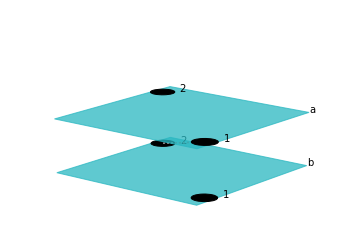

In [20]:
mnet2 = MultilayerNetwork(aspects=2)
mnet2[1,2,'a','b','x','y']=1
mnet2[1,'a','x'][2,'b','y']
mnet2.add_layer('c',1)
mnet2.add_layer('z',2)
fig = draw(mnet)

In [9]:

mplex = MultiplexNetwork(couplings="none")
mplex.add_layer('a')
mplex.add_layer('b')
#mnet.add_node(2)
#mplex[1,'a'][2,'a']=1
#mplex.A['a'][1,2]
mplex.A['a'][1,3] = 1
mplex.A['b'][1,3] = 1
fig = draw(mplex, nodeLabelRule = {}, layout = "spring" )

NameError: name 'MultiplexNetwork' is not defined

In [6]:
#for i in org:
#    for n in range(0,len(locals()['EDGES_'+str(i[0])])):
#        print([locals()['EDGES_'+str(i[0])][n][0],locals()['EDGES_'+str(i[0])][n][0]])

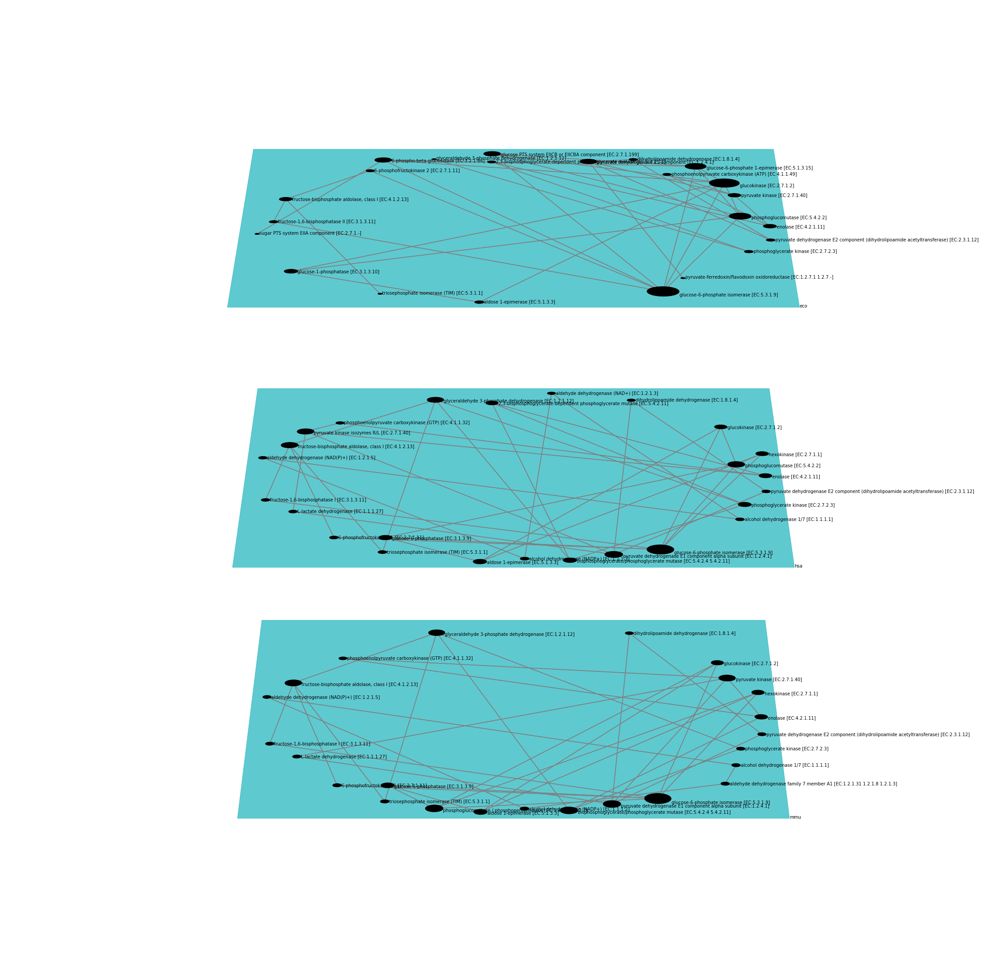

In [24]:
org=[['hsa','01040'],['mmu','01040'] ,['eco','01040']]
pathnet = MultiplexNetwork()

for i in org:
    pathnet.add_layer(i[0])
#    for n in range(0,len(locals()['EDGES_'+str(i[0])])):
    for n in range(0,50):
        pathnet.A[i[0]][locals()['EDGES_'+str(i[0])][n][0],locals()['EDGES_'+str(i[0])][n][1]] = 1
fig = draw(pathnet, show = True,
             layout = "spring", 
             layerColorRule = {}, 
             #defaultLayerColor = "blue", 
             #nodeLabelRule = {},
             figsize = (40,40),
             camera_dist = 10,
             azim = 0,
             elev = 20,
             #layergap = 1, 
             #autoscale = True ,
             #alignedNodes = True,
             nodeSizeRule={"rule":"degree","propscale":0.05}) 
fig.savefig( "net.pdf" )


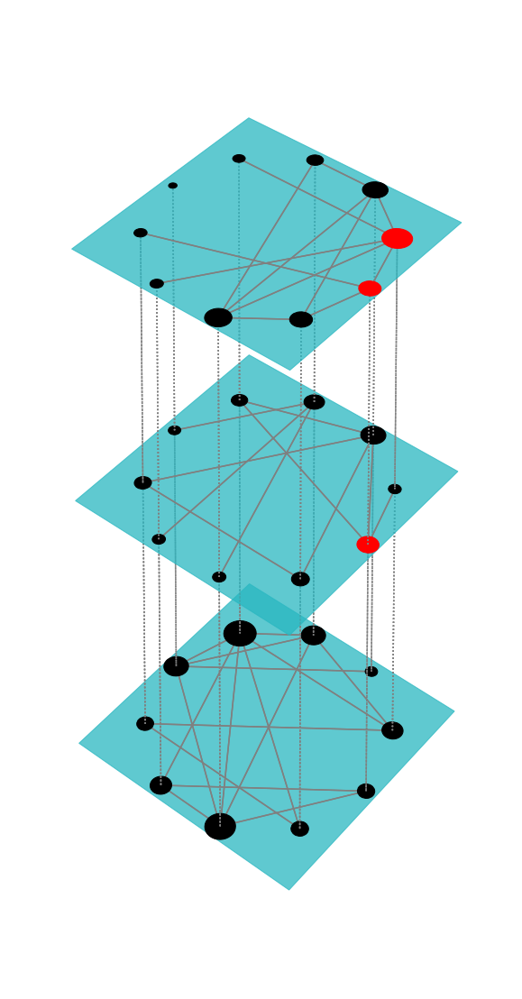

In [22]:
fig=draw(er(10,3*[0.3]),
             layout='shell',
             #layershape="circle",
             nodeColorDict={(0,0):"r",(1,0):"r",(0,1):"r"},
             layerLabelRule={},
             nodeLabelRule={},
             figsize = (10,20),
             nodeSizeRule={"rule":"degree","propscale":0.05})

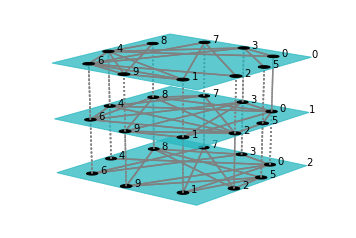

In [9]:
fig = draw ( er ( 10 , 3 * [ 0.4 ]), layout = "spring" )

In [32]:
#G=nx.DiGraph()

#G.add_edge(3,2)
#G.add_edge(2,3)
#G.add_edge(4,3)
#G.add_edge(5,4)
#G.add_edge(5,6)

#nx.draw_kamada_kawai(G,font_size=15,node_size=1000,node_color='orange',with_labels=False)
 
#plt.show()

#nx.reciprocity(G)


# Distribucion de grado

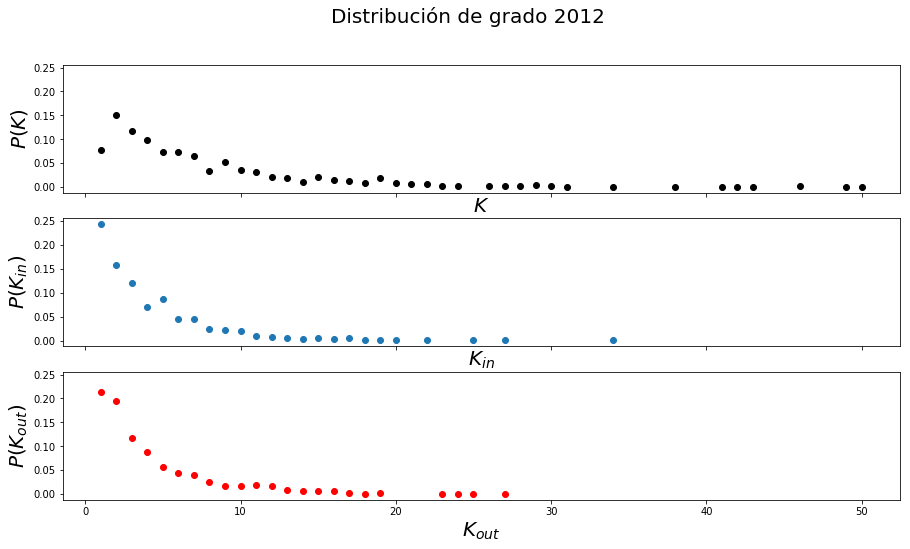

In [29]:
G=G_hsa

nodos=G.nodes

D=[] # un vector donde vamos a colocar el numero de vinvulos de todos los nodos
d=nx.degree(G) # Vector que contiene el par ordenado del nodo y su numero de vinculos
for i in nodos: 
    D.append(d[i])
    

D_in=[] # un vector donde vamos a colocar el numero de vinvulos de todos los nodos
d=G.in_degree(G) # Vector que contiene el par ordenado del nodo y su numero de vinculos
for i in nodos: 
    D_in.append(d[i])
    
    
D_out=[] # un vector donde vamos a colocar el numero de vinvulos de todos los nodos
d=G.out_degree(G) # Vector que contiene el par ordenado del nodo y su numero de vinculos
for i in nodos: 
    D_out.append(d[i])
    
    
P=[]
X=[]
for i in range(1,max(D)+1):
    if D.count(i) != 0: 
        P.append(D.count(i)/len(D))
        X.append(i)

 
        
        
P_in=[]
X_in=[]
for i in range(1,max(D_in)+1):
    if D_in.count(i) != 0: 
        P_in.append(D_in.count(i)/len(D_in))
        X_in.append(i)  

       
P_out=[]
X_out=[]
for i in range(1,max(D)+1):
    if D_out.count(i) != 0: 
        P_out.append(D_out.count(i)/len(D_out))
        X_out.append(i)
        
        
        
# GRAFICA DE LA PROVAVILIDAD VS EL NUMERO DE GRADO        
fig, axs = plt.subplots( 3 ,sharex = True, sharey = True, figsize=(15,8))

fig.suptitle('Distribución de grado 2012',fontsize=20)
axs[0].plot(X,P,'ko')         
axs[0].set_xlabel(r'$K$',fontsize=20)
axs[0].set_ylabel(r'$P(K)$',fontsize=20)

axs[1].plot(X_in,P_in,'o')         
axs[1].set_xlabel(r'$K_{in}$',fontsize=20)
axs[1].set_ylabel(r'$P(K_{in})$',fontsize=20)

axs[2].plot(X_out,P_out, 'ro')         
axs[2].set_xlabel(r'$K_{out}$',fontsize=20)
axs[2].set_ylabel(r'$P(K_{out})$',fontsize=20)

#plt.savefig("P_vs_k_2012.pdf")# Guardar la red en pdf.    

plt.show()

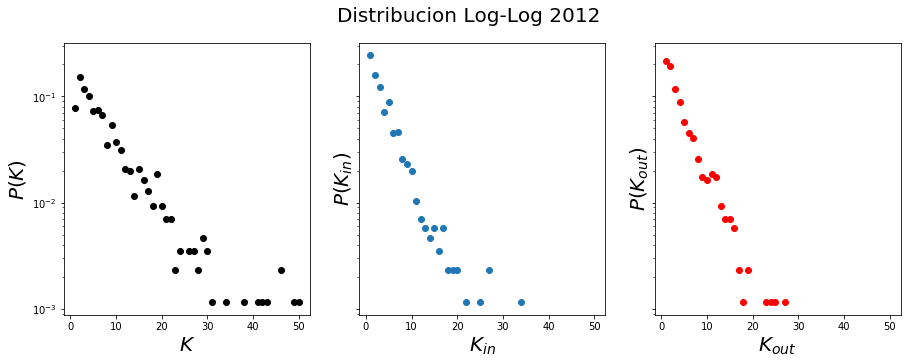

In [31]:

fig, (ax1, ax2 , ax3) = plt.subplots(1, 3 ,sharex = True, sharey = True, figsize=(15,5))
fig.suptitle('Distribucion Log-Log 2012',fontsize=20)
ax1.plot(X,P,'ko')
ax1.set_xlabel(r'$K$',fontsize=20)
ax1.set_ylabel(r'$P(K)$',fontsize=20)

ax2.plot(X_in,P_in,'o')
ax2.set_xlabel(r'$K_{in}$',fontsize=20)
ax2.set_ylabel(r'$P(K_{in})$',fontsize=20)

ax3.plot(X_out,P_out,'ro')
ax3.set_xlabel(r'$K_{out}$',fontsize=20)
ax3.set_ylabel(r'$P(K_{out})$',fontsize=20)

# Escala log-log
# plt.xscale('log') 
plt.yscale('log') 

#plt.savefig("Ley_de_potencias_2012.pdf")# Guardar la red en pdf.

plt.show()

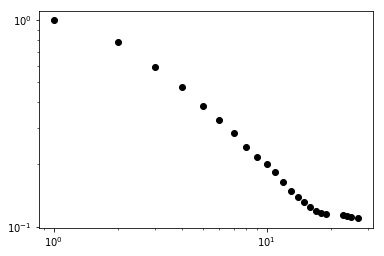

In [33]:
G=G_hsa

nodos=G.nodes

D=[] # un vector donde vamos a colocar el numero de vinvulos de todos los nodos
d=nx.degree(G) # Vector que contiene el par ordenado del nodo y su numero de vinculos
for i in nodos: 
    D.append(d[i])
    

D_in=[] # un vector donde vamos a colocar el numero de vinvulos de todos los nodos
d=G.in_degree(G) # Vector que contiene el par ordenado del nodo y su numero de vinculos
for i in nodos: 
    D_in.append(d[i])
    
    
D_out=[] # un vector donde vamos a colocar el numero de vinvulos de todos los nodos
d=G.out_degree(G) # Vector que contiene el par ordenado del nodo y su numero de vinculos
for i in nodos: 
    D_out.append(d[i])
    

## IMPORTANTEEEEEEEEE....
    
P=[]
X=[]
for i in range(1,max(D)+1):
    if D.count(i) != 0:
        suma=0
        for j in range(1,i):
            suma=D.count(j)+suma
        P.append([1-suma/len(D)])
        X.append([i]) 

        
        
P_in=[]
X_in=[]
for i in range(2,max(D_in)+1):
    if D_in.count(i) != 0: 
        suma=0
        for j in range(1,i):
            suma=D_in.count(j)+suma
        P_in.append([1-suma/len(D_in)])
        X_in.append([i])  



P_out=[]
X_out=[]
for i in range(1,max(D)+1):
    if D_out.count(i) != 0: 
        suma=0
        for j in range(1,i):
            suma=D_out.count(j)+suma
        P_out.append([1-suma/len(D_out)])
        X_out.append([i])
        
#print(P_out)        
#plt.plot(X_in,P_in,'o')
#plt.plot(X,P,'o')
plt.plot(X_out,P_out,'ko')
plt.xscale('log') 
plt.yscale('log') 
plt.show()

Coeficiente alpha:  -0.7835063916593316
Error cuadrático medio: 0.01
Estadístico R_2: 0.98


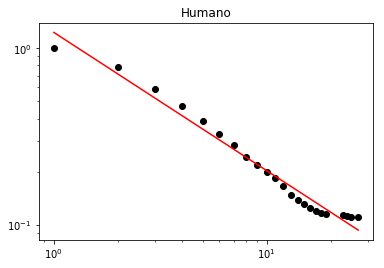

In [35]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score


modelo = linear_model.LinearRegression()
modelo.fit(np.log(X_out), np.log(P_out))

print(u'Coeficiente alpha: ', modelo.coef_[0][0])

y_pred = modelo.predict( np.log(X_out) )


print(u'Error cuadrático medio: %.2f' % mean_squared_error(np.log(P_out), y_pred))
print(u'Estadístico R_2: %.2f' % r2_score(np.log(P_out), y_pred) )


plt.plot(np.exp( np.log(X_out) ), np.exp( np.log(P_out) ),'ko')
plt.plot(np.exp(np.log(X_out)), np.exp(y_pred), color='red')
plt.title('Humano')
plt.xscale('log') 
plt.yscale('log') 
plt.show()

Coeficiente alpha:  -0.9082360558386545
Error cuadrático medio: 0.01
Estadístico R_2: 0.97


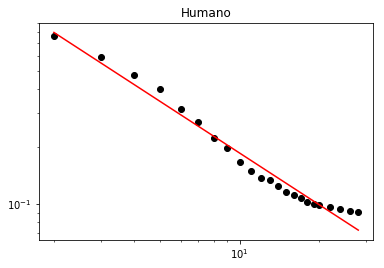

In [62]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score


modelo = linear_model.LinearRegression()
modelo.fit(np.log(X_in), np.log(P_in))

print(u'Coeficiente alpha: ', modelo.coef_[0][0])

y_pred = modelo.predict( np.log(X_in) )


print(u'Error cuadrático medio: %.2f' % mean_squared_error(np.log(P_in), y_pred))
print(u'Estadístico R_2: %.2f' % r2_score(np.log(P_in), y_pred) )


plt.plot(X_in, P_in,'ko')
plt.plot(X_in, np.exp(y_pred), color='red')
plt.title('Humano')
plt.xscale('log') 
plt.yscale('log') 

plt.show()

# ENZIMAS EN TODAS LAS REDES

In [45]:
for i in org:
    locals()['NODOS_'+str(i[0])]=[]
      
    for j in locals()['G_'+str(i[0])].nodes:
        locals()['NODOS_'+str(i[0])].append(j)


In [46]:
nodos=[]
for i in org:
        
    for j in locals()['G_'+str(i[0])].nodes:
        nodos.append(j)

In [47]:
df=pd.DataFrame(nodos, columns=['nodos'])
#for i in
contnod=[]
for i in nodos:
    contnod.append(nodos.count(i))

df['contnodos']=contnod
df=df.drop_duplicates(subset = 'nodos')
df[df['contnodos'] == 13]

,nodos,contnodos
3,triosephosphate isomerase (TIM) [EC:5.3.1.1],13
7,enolase [EC:4.2.1.11],13
8,phosphoglycerate kinase [EC:2.7.2.3],13
23,transketolase [EC:2.2.1.1],13
26,ribose-phosphate pyrophosphokinase [EC:2.7.6.1],13
36,mannose-1-phosphate guanylyltransferase [EC:2....,13
47,glutamine synthetase [EC:6.3.1.2],13
65,adenylosuccinate lyase [EC:4.3.2.2],13
69,adenylosuccinate synthase [EC:6.3.4.4],13
70,adenylate kinase [EC:2.7.4.3],13


In [48]:
Enzprim=df[df['contnodos'] == 13]


## POR DIFERENCIA DE GRADO DE ENZIMA

In [63]:
tab_enz=[]
for j in Enzprim.values:
        tab_enz.append(j[0])
tab_enz=pd.DataFrame(tab_enz, columns=['Nombre'])  
tab_enz



,Nombre
0,triosephosphate isomerase (TIM) [EC:5.3.1.1]
1,enolase [EC:4.2.1.11]
2,phosphoglycerate kinase [EC:2.7.2.3]
3,transketolase [EC:2.2.1.1]
4,ribose-phosphate pyrophosphokinase [EC:2.7.6.1]
5,mannose-1-phosphate guanylyltransferase [EC:2....
6,glutamine synthetase [EC:6.3.1.2]
7,adenylosuccinate lyase [EC:4.3.2.2]
8,adenylosuccinate synthase [EC:6.3.4.4]
9,adenylate kinase [EC:2.7.4.3]


In [64]:
kp.enz_position_dfinout(G_hsa,'methionyl-tRNA synthetase [EC:6.1.1.10]')

-3

In [65]:
for i in org:
    locals()['tab_enz'+str(i[0])]=[]
      
    for j in Enzprim.values:
        num=kp.enz_position_dfinout(locals()['G_'+str(i[0])] , j[0])
        locals()['tab_enz'+str(i[0])].append(num)
        
    tab_enz[i[0]]=locals()['tab_enz'+str(i[0])]

In [66]:
tab_enz.T

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
Nombre,triosephosphate isomerase (TIM) [EC:5.3.1.1],enolase [EC:4.2.1.11],phosphoglycerate kinase [EC:2.7.2.3],transketolase [EC:2.2.1.1],ribose-phosphate pyrophosphokinase [EC:2.7.6.1],mannose-1-phosphate guanylyltransferase [EC:2....,glutamine synthetase [EC:6.3.1.2],adenylosuccinate lyase [EC:4.3.2.2],adenylosuccinate synthase [EC:6.3.4.4],adenylate kinase [EC:2.7.4.3],...,glutamine---fructose-6-phosphate transaminase ...,glycine hydroxymethyltransferase [EC:2.1.2.1],S-adenosylmethionine synthetase [EC:2.5.1.6],S-adenosylmethionine decarboxylase [EC:4.1.1.50],spermidine synthase [EC:2.5.1.16],methionyl-tRNA synthetase [EC:6.1.1.10],UDP-glucose 4-epimerase [EC:5.1.3.2],glycerol-3-phosphate dehydrogenase [EC:1.1.5.3],NAD+ kinase [EC:2.7.1.23],nicotinate phosphoribosyltransferase [EC:6.3.4...
sai,-2,6,-1,0,-6,1,4,3,-4,-3,...,0,-1,-1,1,-1,-1,-1,-1,2,2
tac,-1,4,-2,-1,-4,1,3,3,-7,-3,...,-2,0,1,0,0,-2,-1,-1,2,1
eco,-3,2,1,-1,-4,1,1,3,-11,-4,...,-4,-6,3,1,0,-2,0,2,5,7
hsa,-2,2,2,-1,-6,1,4,3,-13,-6,...,0,-8,3,1,1,-3,1,1,6,7
ptr,-2,2,2,-1,-6,1,4,3,-13,-6,...,0,-8,3,1,1,-3,1,1,6,7
ath,-4,1,-1,0,-6,-1,2,0,-10,-2,...,-2,-3,1,2,2,-2,-1,-1,4,4
mmu,-2,2,1,-1,-5,1,4,3,-13,-6,...,0,-9,3,1,1,-3,1,1,7,7
cac,-2,2,0,0,-5,1,1,3,-8,0,...,-3,-2,1,1,0,-2,-1,0,3,5
cel,-2,3,0,-1,-6,1,2,0,-8,-2,...,-1,-2,2,0,1,-2,1,2,4,4


In [71]:

tab_enz_t=tab_enz.T
tab_enz_t.columns = tab_enz_t.iloc[0]
tab_enz_t=tab_enz_t.drop(['Nombre'])
tab_enz_t['org']=tab_enz_t.index


In [68]:
tab_enz_t['methionyl-tRNA synthetase [EC:6.1.1.10]']

sai    -1
tac    -2
eco    -2
hsa    -3
ptr    -3
ath    -2
mmu    -3
cac    -2
cel    -2
dme    -2
lma    -2
sce    -3
sfx    -2
Name: methionyl-tRNA synthetase [EC:6.1.1.10], dtype: object

In [76]:
df=pd.merge(table, tab_enz_t, left_on='Nombre', right_on='org')
#df=df.drop(['org'], axis='columns')
del df['org']
df.T

df=df.T
df.columns = df.iloc[0]
df=df.drop(['Nombre'])
df

Nombre,sai,tac,eco,hsa,ptr,ath,mmu,cac,cel,dme,lma,sce,sfx
N_nodos,276,240,682,803,811,787,796,414,483,522,288,495,610
N_edges,485,471,1811,3066,3059,2069,2953,877,1373,1437,592,1253,1547
grado_promedio,1.75725,1.9625,2.65543,3.81818,3.77189,2.62897,3.7098,2.11836,2.84265,2.75287,2.05556,2.53131,2.53607
densidad,0.01278,0.0164226,0.00779861,0.00952165,0.0093133,0.00668949,0.00933283,0.0102584,0.0117952,0.0105677,0.0143244,0.0102482,0.00832862
reciprocidad,0.247423,0.280255,0.192159,0.270059,0.264139,0.245529,0.263461,0.216648,0.268026,0.268615,0.25,0.252195,0.188752
asortatividad,0.327979,0.367196,0.313523,0.240585,0.239629,0.26288,0.209955,0.359466,0.267403,0.237661,0.332227,0.290489,0.272465
inter_grupo,0.0293467,0.0433322,0.0838561,0.0801878,0.0827186,0.0776242,0.084099,0.0594426,0.0673335,0.0899154,0.0852429,0.0743791,0.066824
cerc_grupo,0.154181,0.139514,0.127802,0.159407,0.159345,0.102513,0.156519,0.115749,0.162839,0.144918,0.146302,0.127624,0.137226
transitividad,0.212862,0.302694,0.250179,0.274731,0.278135,0.263467,0.275359,0.236584,0.261595,0.239993,0.233597,0.264965,0.244448
cluster_promedio,0.234575,0.302162,0.343522,0.427219,0.431662,0.39295,0.423773,0.287451,0.350546,0.361672,0.280523,0.336716,0.323018


In [57]:
tab_enz_t.sort_values(by= 'transketolase [EC:2.2.1.1]' , ascending=False)

Nombre,triosephosphate isomerase (TIM) [EC:5.3.1.1],enolase [EC:4.2.1.11],phosphoglycerate kinase [EC:2.7.2.3],transketolase [EC:2.2.1.1],ribose-phosphate pyrophosphokinase [EC:2.7.6.1],mannose-1-phosphate guanylyltransferase [EC:2.7.7.13],glutamine synthetase [EC:6.3.1.2],adenylosuccinate lyase [EC:4.3.2.2],adenylosuccinate synthase [EC:6.3.4.4],adenylate kinase [EC:2.7.4.3],...,glycine hydroxymethyltransferase [EC:2.1.2.1],S-adenosylmethionine synthetase [EC:2.5.1.6],S-adenosylmethionine decarboxylase [EC:4.1.1.50],spermidine synthase [EC:2.5.1.16],methionyl-tRNA synthetase [EC:6.1.1.10],UDP-glucose 4-epimerase [EC:5.1.3.2],glycerol-3-phosphate dehydrogenase [EC:1.1.5.3],NAD+ kinase [EC:2.7.1.23],nicotinate phosphoribosyltransferase [EC:6.3.4.21],org
sai,-2,6,-1,0,-6,1,4,3,-4,-3,...,-1,-1,1,-1,-1,-1,-1,2,2,sai
ath,-4,1,-1,0,-6,-1,2,0,-10,-2,...,-3,1,2,2,-2,-1,-1,4,4,ath
cac,-2,2,0,0,-5,1,1,3,-8,0,...,-2,1,1,0,-2,-1,0,3,5,cac
tac,-1,4,-2,-1,-4,1,3,3,-7,-3,...,0,1,0,0,-2,-1,-1,2,1,tac
eco,-3,2,1,-1,-4,1,1,3,-11,-4,...,-6,3,1,0,-2,0,2,5,7,eco
hsa,-2,2,2,-1,-6,1,4,3,-13,-6,...,-8,3,1,1,-3,1,1,6,7,hsa
ptr,-2,2,2,-1,-6,1,4,3,-13,-6,...,-8,3,1,1,-3,1,1,6,7,ptr
mmu,-2,2,1,-1,-5,1,4,3,-13,-6,...,-9,3,1,1,-3,1,1,7,7,mmu
cel,-2,3,0,-1,-6,1,2,0,-8,-2,...,-2,2,0,1,-2,1,2,4,4,cel
dme,-1,2,2,-1,-5,1,3,2,-8,-4,...,-4,1,0,1,-2,0,2,3,3,dme


In [ ]:
'UDP-glucose 4-epimerase [EC:5.1.3.2]'

##  POR INTERMEDIACION ENZIMATICA

In [58]:
tab_enz=[]
for j in Enzprim.values:
        tab_enz.append(j[0])
tab_enz=pd.DataFrame(tab_enz, columns=['Nombre'])  
tab_enz 

,Nombre
0,triosephosphate isomerase (TIM) [EC:5.3.1.1]
1,enolase [EC:4.2.1.11]
2,phosphoglycerate kinase [EC:2.7.2.3]
3,transketolase [EC:2.2.1.1]
4,ribose-phosphate pyrophosphokinase [EC:2.7.6.1]
5,mannose-1-phosphate guanylyltransferase [EC:2....
6,glutamine synthetase [EC:6.3.1.2]
7,adenylosuccinate lyase [EC:4.3.2.2]
8,adenylosuccinate synthase [EC:6.3.4.4]
9,adenylate kinase [EC:2.7.4.3]


In [59]:
for i in org:
    locals()['tab_enz'+str(i[0])]=[]
      
    for j in Enzprim.values:
        num=kp.enz_position_inter(locals()['G_'+str(i[0])] , j[0])
        locals()['tab_enz'+str(i[0])].append(num)
        
    tab_enz[i[0]]=locals()['tab_enz'+str(i[0])]

In [60]:
tab_enz_t=tab_enz.T
tab_enz_t.columns = tab_enz_t.iloc[0]
tab_enz_t=tab_enz_t.drop(['Nombre'])
tab_enz_t

Nombre,triosephosphate isomerase (TIM) [EC:5.3.1.1],enolase [EC:4.2.1.11],phosphoglycerate kinase [EC:2.7.2.3],transketolase [EC:2.2.1.1],ribose-phosphate pyrophosphokinase [EC:2.7.6.1],mannose-1-phosphate guanylyltransferase [EC:2.7.7.13],glutamine synthetase [EC:6.3.1.2],adenylosuccinate lyase [EC:4.3.2.2],adenylosuccinate synthase [EC:6.3.4.4],adenylate kinase [EC:2.7.4.3],...,glutamine---fructose-6-phosphate transaminase (isomerizing) [EC:2.6.1.16],glycine hydroxymethyltransferase [EC:2.1.2.1],S-adenosylmethionine synthetase [EC:2.5.1.6],S-adenosylmethionine decarboxylase [EC:4.1.1.50],spermidine synthase [EC:2.5.1.16],methionyl-tRNA synthetase [EC:6.1.1.10],UDP-glucose 4-epimerase [EC:5.1.3.2],glycerol-3-phosphate dehydrogenase [EC:1.1.5.3],NAD+ kinase [EC:2.7.1.23],nicotinate phosphoribosyltransferase [EC:6.3.4.21]
sai,0.00108162,0,0,0.000867065,0,0,5.30856e-05,0.00122097,1.32714e-05,0.00729263,...,0.000550763,0.00885338,0.000119443,0.000199071,0.000159257,0,0,0,0,0
tac,0,0,0,0.00109291,0,0,0.000436576,0.0277475,0.000549383,0.0374284,...,0.000527408,0.0186382,0.000210963,0.000210963,0.000193383,0,0,0,0,0
eco,0.000151162,0.0182089,0.0356429,0.00991661,0.00281908,0.000328237,0.00321739,0.0064003,0.0101608,0.0115394,...,0.0150303,0.0341625,0.00461472,0.00249162,0.0173401,0,0.00182798,0,0,0.000461825
hsa,0,0.00513949,0.0006839,0.00725794,0.00079,0.00173723,0.00345263,0.0047456,0.0103848,0.0032697,...,0.0060023,0.0152398,0.00163473,0.00215011,0.00642549,0,0.0293455,7.78329e-07,0,0
ptr,0,0.00520816,0.000664232,0.00697005,0.000775538,0.00166033,0.00339844,0.0049727,0.0120574,0.00421939,...,0.0058317,0.0119783,0.00159312,0.00208206,0.00617802,0,0.0270788,7.63021e-07,0,0
ath,0.000625969,0.035353,0.0412706,0.0453375,0,0.0031912,0.0183393,0.00748333,0.00495171,0.0141626,...,0.0487419,0.0108798,0.00132031,0.000164989,0.00257467,7.08254e-05,0.00148644,0,0,0.00625516
mmu,0,0.0050607,0,0.0089168,0.0116034,0.00170778,0.00353458,0.00594149,0.00993731,0.00389818,...,0.00565846,0.0159455,0.00160106,0.00216503,0.0062815,0,0.0305367,7.92104e-07,0,0
cac,0,0.00571828,0.00167787,0.00352714,0.000997824,0.000622958,0.000149862,0.00869411,0.000790451,0.0216442,...,0.00141635,0.0193147,0.00320882,0.00081102,0.00086979,0,0.000802205,2.64463e-05,0,0
cel,0,0,0.00570007,0.00954603,0.00142974,0.00249308,0.00276235,0.0125751,0.0217337,0.0205183,...,0.0234284,0.0208848,0.00371805,0.00248445,0.00125517,0,0.000456489,0,0,0
dme,0,0.00214807,0,0.00641708,0.00776539,0.00209656,0.00193615,0.0137557,0.0195479,0.0149309,...,0.0175961,0.0210308,0.00413406,0.00311162,0.000564742,0,1.47645e-05,0,0,0


In [55]:
tab_enz_t.sort_values(by= 'transketolase [EC:2.2.1.1]' , ascending=False)

enzima,triosephosphate isomerase (TIM) [EC:5.3.1.1],enolase [EC:4.2.1.11],phosphoglycerate kinase [EC:2.7.2.3],transketolase [EC:2.2.1.1],ribose-phosphate pyrophosphokinase [EC:2.7.6.1],mannose-1-phosphate guanylyltransferase [EC:2.7.7.13],glutamine synthetase [EC:6.3.1.2],adenylosuccinate lyase [EC:4.3.2.2],adenylosuccinate synthase [EC:6.3.4.4],adenylate kinase [EC:2.7.4.3],...,glutamine---fructose-6-phosphate transaminase (isomerizing) [EC:2.6.1.16],glycine hydroxymethyltransferase [EC:2.1.2.1],S-adenosylmethionine synthetase [EC:2.5.1.6],S-adenosylmethionine decarboxylase [EC:4.1.1.50],spermidine synthase [EC:2.5.1.16],methionyl-tRNA synthetase [EC:6.1.1.10],UDP-glucose 4-epimerase [EC:5.1.3.2],glycerol-3-phosphate dehydrogenase [EC:1.1.5.3],NAD+ kinase [EC:2.7.1.23],nicotinate phosphoribosyltransferase [EC:6.3.4.21]
ath,0.000625969,0.035353,0.0412706,0.0453375,0,0.0031912,0.0183393,0.00748333,0.00495171,0.0141626,...,0.0487419,0.0108798,0.00132031,0.000164989,0.00257467,7.08254e-05,0.00148644,0,0,0.00625516
lma,0,0.024813,0.0224495,0.0118316,0,0,0.0196791,0.00586196,0.0155138,0.0376538,...,0.0190139,0.0130033,0.0115769,0.0119641,0.0158883,0,0.00347214,0,0,0
eco,0.000151162,0.0182089,0.0356429,0.00991661,0.00281908,0.000328237,0.00321739,0.0064003,0.0101608,0.0115394,...,0.0150303,0.0341625,0.00461472,0.00249162,0.0173401,0,0.00182798,0,0,0.000461825
cel,0,0,0.00570007,0.00954603,0.00142974,0.00249308,0.00276235,0.0125751,0.0217337,0.0205183,...,0.0234284,0.0208848,0.00371805,0.00248445,0.00125517,0,0.000456489,0,0,0
mmu,0,0.0050607,0,0.0089168,0.0116034,0.00170778,0.00353458,0.00594149,0.00993731,0.00389818,...,0.00565846,0.0159455,0.00160106,0.00216503,0.0062815,0,0.0305367,7.92104e-07,0,0
sce,0,0.000958731,0,0.0081906,0,0,0.00639629,0.0134252,0.0478363,0.0279322,...,0.0583391,0.052813,0.000330128,0.000266894,0.00268578,0,0.00457416,0,0,0.000189166
hsa,0,0.00513949,0.0006839,0.00725794,0.00079,0.00173723,0.00345263,0.0047456,0.0103848,0.0032697,...,0.0060023,0.0152398,0.00163473,0.00215011,0.00642549,0,0.0293455,7.78329e-07,0,0
ptr,0,0.00520816,0.000664232,0.00697005,0.000775538,0.00166033,0.00339844,0.0049727,0.0120574,0.00421939,...,0.0058317,0.0119783,0.00159312,0.00208206,0.00617802,0,0.0270788,7.63021e-07,0,0
dme,0,0.00214807,0,0.00641708,0.00776539,0.00209656,0.00193615,0.0137557,0.0195479,0.0149309,...,0.0175961,0.0210308,0.00413406,0.00311162,0.000564742,0,1.47645e-05,0,0,0
sfx,0.00015124,0.0100828,0.0141566,0.00378298,0.00150164,0.000324086,0.00509006,0.00615232,0.0107265,0.0123675,...,0.00531958,0.0368324,0.00509438,0.0025261,0.017534,0,0,0,0,0.000430199


## ANALISIS  GENERACION DE NUEVOS VINCULOS

In [8]:
df=pd.DataFrame(EDGES_eco, columns=['ENZIMA_ORIGEN', 'ENZIMA_DESTINO'])
#df.to_csv('Edges_eco', sep = ';', index=False)
df
df=df[df['ENZIMA_DESTINO'] == 'triosephosphate isomerase (TIM) [EC:5.3.1.1]' ]
df=df.drop_duplicates(subset = 'ENZIMA_ORIGEN')
df_in=df
df_in

,ENZIMA_ORIGEN,ENZIMA_DESTINO
53,"fructose-bisphosphate aldolase, class I [EC:4....",triosephosphate isomerase (TIM) [EC:5.3.1.1]


In [5]:
kp.enzimas_in(EDGES_eco,'triosephosphate isomerase (TIM) [EC:5.3.1.1]')

,ENZIMA_ORIGEN,ENZIMA_DESTINO
53,"fructose-bisphosphate aldolase, class I [EC:4....",triosephosphate isomerase (TIM) [EC:5.3.1.1]


In [37]:
df=pd.DataFrame(EDGES_eco, columns=['ENZIMA_ORIGEN', 'ENZIMA_DESTINO'])
#df.to_csv('Edges_eco', sep = ';', index=False)
df
df=df[df['ENZIMA_ORIGEN'] == 'triosephosphate isomerase (TIM) [EC:5.3.1.1]' ]
df=df.drop_duplicates(subset = 'ENZIMA_DESTINO')
df
df_out=df
df_out

,ENZIMA_ORIGEN,ENZIMA_DESTINO
30,triosephosphate isomerase (TIM) [EC:5.3.1.1],"fructose-bisphosphate aldolase, class I [EC:4...."
52,triosephosphate isomerase (TIM) [EC:5.3.1.1],glyceraldehyde 3-phosphate dehydrogenase [EC:1...
217,triosephosphate isomerase (TIM) [EC:5.3.1.1],rhamnulose-1-phosphate aldolase [EC:4.1.2.19]
236,triosephosphate isomerase (TIM) [EC:5.3.1.1],L-fuculose-phosphate aldolase [EC:4.1.2.17]


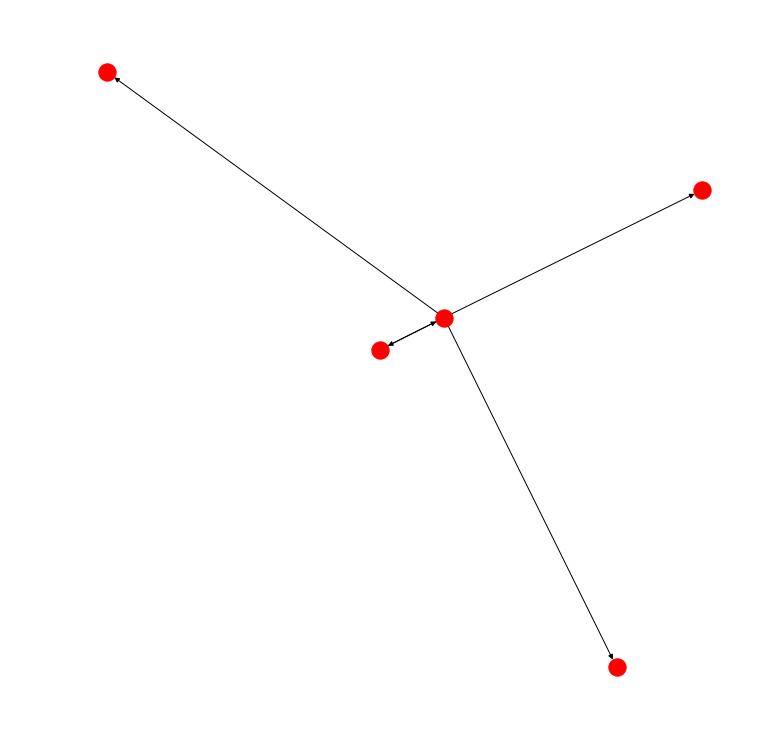

In [8]:
df_in=kp.enzimas_in(EDGES_eco,'triosephosphate isomerase (TIM) [EC:5.3.1.1]')
df_out=kp.enzimas_out(EDGES_eco,'triosephosphate isomerase (TIM) [EC:5.3.1.1]')

G=nx.DiGraph()
G.add_edges_from(df_out.values)
G.add_edges_from(df_in.values)
plt.figure(3,figsize=(10,10))
nx.draw(G) #with_labels=True)



In [119]:
df=pd.DataFrame(EDGES_ath, columns=['ENZIMA_ORIGEN', 'ENZIMA_DESTINO'])
#df.to_csv('Edges_eco', sep = ';', index=False)
df
df=df[df['ENZIMA_ORIGEN'] == 'triosephosphate isomerase (TIM) [EC:5.3.1.1]' ]
df=df.drop_duplicates(subset = 'ENZIMA_DESTINO')
df

,ENZIMA_ORIGEN,ENZIMA_DESTINO
17,triosephosphate isomerase (TIM) [EC:5.3.1.1],"fructose-bisphosphate aldolase, class I [EC:4...."
43,triosephosphate isomerase (TIM) [EC:5.3.1.1],glyceraldehyde 3-phosphate dehydrogenase [EC:1...
44,triosephosphate isomerase (TIM) [EC:5.3.1.1],glyceraldehyde-3-phosphate dehydrogenase (NADP...
188,triosephosphate isomerase (TIM) [EC:5.3.1.1],triose/dihydroxyacetone kinase / FAD-AMP lyase...
2145,triosephosphate isomerase (TIM) [EC:5.3.1.1],glyceraldehyde-3-phosphate dehydrogenase (NADP...
2149,triosephosphate isomerase (TIM) [EC:5.3.1.1],transketolase [EC:2.2.1.1]


[['fructose-bisphosphate aldolase, class I [EC:4.1.2.13]'
  'triosephosphate isomerase (TIM) [EC:5.3.1.1]']
 ['transketolase [EC:2.2.1.1]'
  'triosephosphate isomerase (TIM) [EC:5.3.1.1]']]


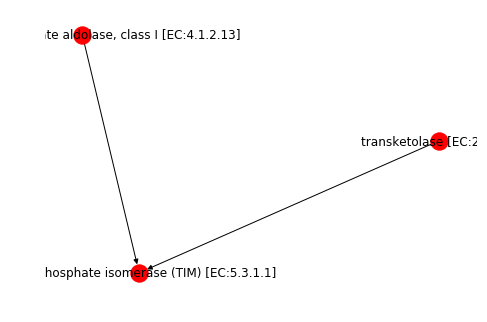

In [22]:
df=pd.DataFrame(EDGES_ath, columns=['ENZIMA_ORIGEN', 'ENZIMA_DESTINO'])
#df.to_csv('Edges_eco', sep = ';', index=False)
df
df=df[df['ENZIMA_DESTINO'] == 'triosephosphate isomerase (TIM) [EC:5.3.1.1]' ]
df=df.drop_duplicates(subset = 'ENZIMA_ORIGEN')
print(df.values)

G=nx.DiGraph()
G.add_edges_from(df.values)

nx.draw(G, with_labels=True)

In [107]:
df=pd.DataFrame(EDGES_hsa, columns=['ENZIMA_ORIGEN', 'ENZIMA_DESTINO'])
#df.to_csv('Edges_eco', sep = ';', index=False)
df
df=df[df['ENZIMA_DESTINO'] == 'triosephosphate isomerase (TIM) [EC:5.3.1.1]' ]
#df=df.drop_duplicates(subset = 'ENZIMA_DESTINO')
df

,ENZIMA_ORIGEN,ENZIMA_DESTINO
48,"fructose-bisphosphate aldolase, class I [EC:4....",triosephosphate isomerase (TIM) [EC:5.3.1.1]


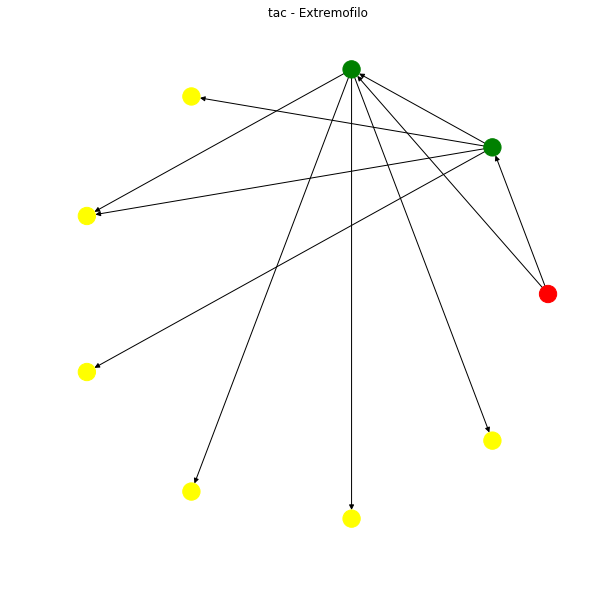

In [39]:

G=nx.DiGraph()


#enzima='UDP-glucose 4-epimerase [EC:5.1.3.2]'    
enzima='methionyl-tRNA synthetase [EC:6.1.1.10]'
#enzima='triosephosphate isomerase (TIM) [EC:5.3.1.1]'
EDGES=EDGES_tac
    
    
#df_in=kp.enzimas_in(EDGES,enzima)
df_out=kp.enzimas_out(EDGES,enzima)


#G.add_edges_from(df_in.values)
#for n in df_in.values:
#    df_in=kp.enzimas_in(EDGES,n[0])
#    G.add_edges_from(df_in.values)
#    for n in df_in.values:
#        df_in=kp.enzimas_in(EDGES,n[0])
#        G.add_edges_from(df_in.values)
    
    
G.add_edges_from(df_out.values)        
#for n in df_out.values:
#    df_in=kp.enzimas_in(EDGES,n[1])
#    G.add_edges_from(df_in.values)

nodes=[]



for i in G.nodes:
    nodes.append(i)



for n in df_out.values:      
    df_out=kp.enzimas_out(EDGES,n[1])
    G.add_edges_from(df_out.values) 
    
#    df_in=kp.enzimas_in(EDGES,n[1])
#    G.add_edges_from(df_in.values)
    
#    for n in df_out.values:      
#        df_out=kp.enzimas_out(EDGES,n[1])
#        G.add_edges_from(df_out.values) 
#        for n in df_out.values:      
#            df_out=kp.enzimas_out(EDGES,n[1])
#            G.add_edges_from(df_out.values)
            
plt.figure(3,figsize=(10,10))
color=[]
for i in G.nodes:
    
    for j in nodes:
        
        if i == enzima: 
            color.append('red')
            break
        if i == j:
            color.append('green')
            break
        
     
    else:
        color.append('yellow')
        
         
       
plt.title('tac - Extremofilo')
nx.draw_circular(G,node_color=color) #, with_labels=True)
plt.savefig('tac')


In [117]:
N=nx.number_of_nodes(G)
E=nx.number_of_edges(G)
print(N)
print(E)

10
10


In [180]:
nodes=[]
for i in nodes1:
    print(i)

methionyl-tRNA synthetase [EC:6.1.1.10]
5-methyltetrahydrofolate--homocysteine methyltransferase [EC:2.1.1.13]
cystathionine gamma-lyase [EC:4.4.1.1]
methionyl-tRNA formyltransferase [EC:2.1.2.9]
adenosylhomocysteinase [EC:3.3.1.1]
kynurenine---oxoglutarate transaminase / cysteine-S-conjugate beta-lyase / glutamine---phenylpyruvate transaminase [EC:2.6.1.7 4.4.1.13 2.6.1.64]
cystathionine beta-synthase [EC:4.2.1.22]
tyrosine aminotransferase [EC:2.6.1.5]
L-amino-acid oxidase [EC:1.4.3.2]
S-adenosylmethionine synthetase [EC:2.5.1.6]
methylenetetrahydrofolate reductase (NADPH) [EC:1.5.1.20]
cysteine dioxygenase [EC:1.13.11.20]
aspartate aminotransferase, cytoplasmic [EC:2.6.1.1]
branched-chain amino acid aminotransferase [EC:2.6.1.42]
alanine-glyoxylate transaminase / (R)-3-amino-2-methylpropionate-pyruvate transaminase [EC:2.6.1.44 2.6.1.40]
thioredoxin reductase (NADPH) [EC:1.8.1.9]
phosphoribosylamine--glycine ligase / phosphoribosylglycinamide formyltransferase / phosphoribosylformyl

## PATHS

In [140]:
path=nx.all_simple_paths(G_ath  , 'phosphoglycerate kinase [EC:2.7.2.3]' , 'enolase [EC:4.2.1.11]' , cutoff= 4)

viaenzima=[]
for i in path:
    for j in i:
        viaenzima.append(j)

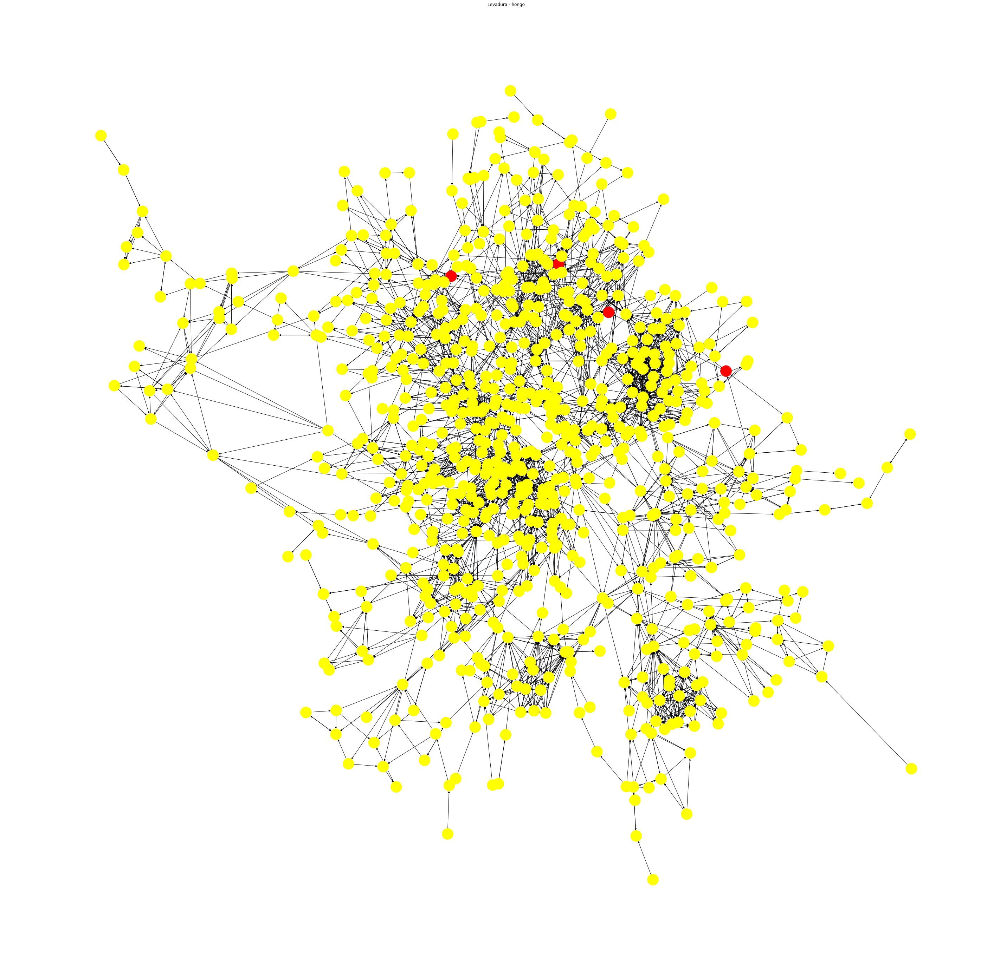

In [143]:
#G=nx.DiGraph()

            
plt.figure(3,figsize=(50,50))
color=[]

for i in G_hsa.nodes:
    
    for j in viaenzima:
        
        if i == j:
            color.append('red')
            break
        
     
    else:
        color.append('yellow')
        
         
       
plt.title('Levadura - hongo')
nx.draw_kamada_kawai(G_hsa,font_size=15,node_size=1000,node_color=color, with_labels=False)


In [147]:
G=G_eco

path=nx.all_simple_paths(G , 'phosphoglycerate kinase [EC:2.7.2.3]' , 'enolase [EC:4.2.1.11]' , cutoff= 20)

viaenzima=[]
for i in path:
    for j in i:
        viaenzima.append(j)
        
            
plt.figure(3,figsize=(50,50))
color=[]

for i in G.nodes:
    
    for j in viaenzima:
        
        if i == j:
            color.append('red')
            break
        
     
    else:
        color.append('yellow')
        
         
       
plt.title('Levadura - hongo')
nx.draw_kamada_kawai(G,font_size=15,node_size=1000,node_color=color, with_labels=False)
        

KeyboardInterrupt: 

In [205]:
G=G_sai
path=nx.all_simple_paths(G , 'phosphoglycerate kinase [EC:2.7.2.3]' , 'enolase [EC:4.2.1.11]' , cutoff= 3)

viaenzima=[]
for i in path:
    for j in i:
        viaenzima.append(j)
no_nodos=[]
for i in G.nodes: 
    for j in viaenzima:
        if i == j:
            break
    else:
        no_nodos.append(i)

for  i in no_nodos: 
    G.remove_node(i)
    

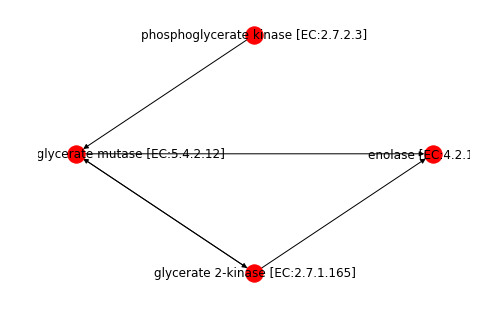

In [206]:
nx.draw_circular(G, with_labels=True )

    

In [158]:
nodos

['glucokinase [EC:2.7.1.2]',
 'glucose-1-phosphatase [EC:3.1.3.10]',
 'aldose 1-epimerase [EC:5.1.3.3]',
 '6-phospho-beta-glucosidase [EC:3.2.1.86]',
 'glucose-6-phosphate isomerase [EC:5.3.1.9]',
 'glucose-6-phosphate 1-epimerase [EC:5.1.3.15]',
 'glucose PTS system EIICB or EIICBA component [EC:2.7.1.199]',
 'phosphoglucomutase [EC:5.4.2.2]',
 'fructose-1,6-bisphosphatase II [EC:3.1.3.11]',
 '6-phosphofructokinase 2 [EC:2.7.1.11]',
 'fructose-bisphosphate aldolase, class I [EC:4.1.2.13]',
 'triosephosphate isomerase (TIM) [EC:5.3.1.1]',
 'glyceraldehyde 3-phosphate dehydrogenase [EC:1.2.1.12]',
 'phosphoglycerate kinase [EC:2.7.2.3]',
 '2,3-bisphosphoglycerate-dependent phosphoglycerate mutase [EC:5.4.2.11]',
 'enolase [EC:4.2.1.11]',
 'pyruvate dehydrogenase E1 component [EC:1.2.4.1]',
 'pyruvate dehydrogenase E2 component (dihydrolipoamide acetyltransferase) [EC:2.3.1.12]',
 'dihydrolipoamide dehydrogenase [EC:1.8.1.4]',
 'pyruvate kinase [EC:2.7.1.40]',
 'sugar PTS system EIIA com

In [114]:
#for i in nx.simple_cycles(G_hsa):
#    print(i)

#len(list(nx.simple_cycles(G_hsa)))

In [31]:
nodos_sai=[]
for i in G_sai.nodes:
    nodos_sai.append(i)
#df=pd.DataFrame(nodos_hsa)    
#df.to_csv('nodos_hsa', sep=';')

In [34]:
#n=nodos_hsa[0].replace('[','').replace(']','').find('EC')
#enz=nodos_hsa[0].replace('[','').replace(']','')[n:]
#nodos_hsa[0]
#enz

In [35]:
NODOS=[]
for i in nodos_sai:
    n=i.replace('[','').replace(']','').find('EC')
    enz=i.replace('[','').replace(']','')[n:]
    NODOS.append([i,enz])

#NODOS=pd.DataFrame(NODOS)   
#NODOS.to_csv('nodos_sai', sep=';')

In [130]:

base='https://www.genome.jp/dbget-bin/www_bget?'
comp=NODOS[20][1]
url=base+comp
print(url)
response = requests.get(url)
soup = BeautifulSoup(response.text, "html.parser")



https://www.genome.jp/dbget-bin/www_bget?EC:6.2.1.5


In [131]:
n=soup.tr.td.find_all('table')[3].find_all('td')[4].text.find(';')
soup.tr.td.find_all('table')[3].find_all('td')[4].text[:n]

'Ligases'

In [132]:
soup.text.find('No such data was found')

-1

In [128]:

base='https://www.genome.jp/dbget-bin/www_bget?'
comp=NODOS[131][1]
url=base+comp
print(url)
response = requests.get(url)
soup = BeautifulSoup(response.text, "html.parser")



https://www.genome.jp/dbget-bin/www_bget?EC:2.6.1.-


In [129]:
soup.text.find('No such data was found')

63

In [133]:
n=soup.tr.td.find_all('table')[3].find_all('td')[4].text.find(';')
soup.tr.td.find_all('table')[3].find_all('td')[4].text[:n]

'Ligases'

In [4]:
#Parsear HTML
import requests
import urllib.request
from bs4 import BeautifulSoup
from urllib.request import urlopen
from bs4.builder import HTMLParserTreeBuilder

import csv  

In [18]:
org=[#['ath','01040'],  # Falta
     #['cac','01100'],  # ya
     #['cel','01040'],  # ya
     ['dme','01040']]
     #['lma','01040'],
     #['sce','01040'],
     #['sfx','01040']]

save=len(pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')[['Nombre']].values)

save

111

In [11]:
org=[['ath','01040']] #f
     #['cac','01100'], #y
     #['cel','01040'], #y
     #['dme','01040'], #y
     #['lma','01040']] #y
     #['sce','01040']] #y
     #['sfx','01040']]


for o in org:
    
       
    locals()['ClaseEnzima_'+str(o[0])] = pd.DataFrame(columns=('Nombre', 'Codigo', 'Clase')) # Crear tabla csv. 
    locals()['ClaseEnzima_'+str(o[0])].to_csv('ClaseEnzima_'+o[0]+'.csv', sep=';') 
    
    save=len(pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')[['Nombre']].values)
       
    nodos=[]
    for n in locals()['G_'+str(o[0])].nodes:
        nodos.append(n)
    
    NODOS=[]
    for N in nodos:
        n=N.replace('[','').replace(']','').find('EC')
        enz=N.replace('[','').replace(']','')[n:]
        NODOS.append([N,enz])
    m=0
    for i in NODOS:
        m=m+1
        
        if m > save:
            base='https://www.genome.jp/dbget-bin/www_bget?'
            comp=i[1]
            url=base+comp
            response = requests.get(url)
            soup = BeautifulSoup(response.text, "html.parser")
        
            if soup.text.find('No such data was found') == -1: #si -1 la palabra que estamos buscando no esta. 
                n=soup.tr.td.find_all('table')[3].find_all('td')[4].text.find(';')
                clase=soup.tr.td.find_all('table')[3].find_all('td')[4].text[:n]
                
                
                NewDat = [ i[0] , i[1] , clase]          
                            
                
                
            else: 
                NewDat = [ i[0] , i[1] , 'No informacion'] 
                
                
            with open(r'ClaseEnzima_'+o[0]+'.csv', 'a' , newline='') as f:
                writer = csv.writer(f,delimiter=';')
                writer.writerow(NewDat)    
        
        print(m)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


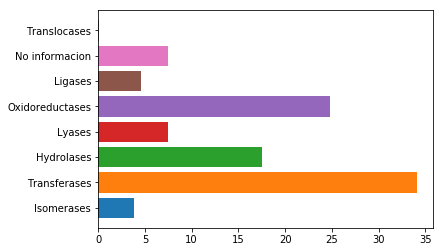

In [5]:
import os

org=[['hsa','01040']]

#os.chdir('/home/haku/Documentos/TESIS/PROYECTO/')


for o in org:    
    
    path=os.getcwd()
    os.chdir('ClaseEnzim')       #Cambia la ejecuicon del programa a otra carpeta. 
 
    #locals()['ClassEnzima_'+str(o[0])]=pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')[['Clase']].values
    ClassEnzima_ath=pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')[['Clase']].values
    
    os.chdir(path)
    
 




Class_ath=[]
for i in ClassEnzima_ath:
    Class_ath.append(i[0])


ClassEnzima_ath=pd.DataFrame(ClassEnzima_ath, columns=['Clase'])   

cont=[]
for i in Class_ath:
    cont.append(Class_ath.count(i)/len(Class_ath)*100)

ClassEnzima_ath['cont']=cont
ClassEnzima_ath=ClassEnzima_ath.drop_duplicates(subset = 'Clase')

for j in ClassEnzima_ath.values:
    plt.barh(j[0],j[1])



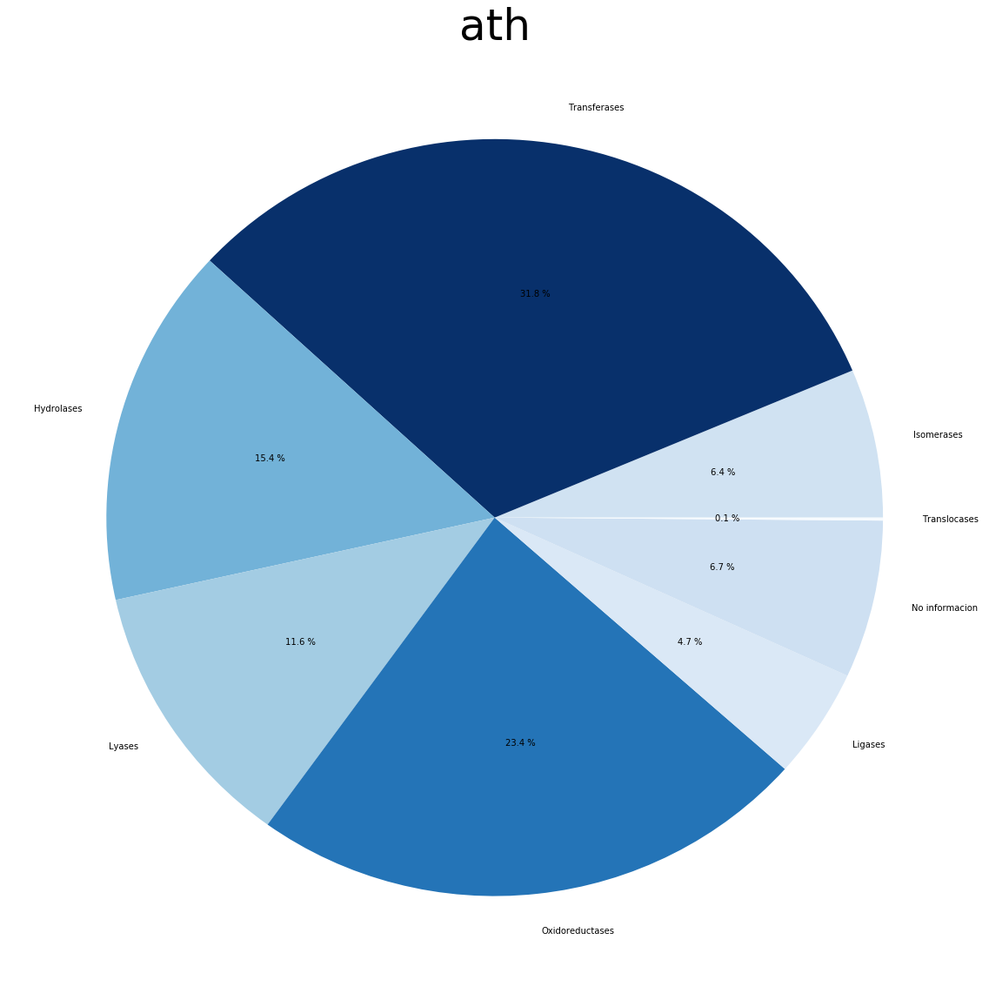

In [11]:
org=[#['sai','01100']]
     #['tac','01100']]
     #['eco','01040']]
     #['hsa','01040']]
     #['ptr','01040'],
     ['ath','01040']]
     #['mmu','01040']]
     #['cac','01100'],
     #['cel','01040'],
     #['dme','01040'],
     #['lma','01040'],
     #['sce','01040'],
     #['sfx','01040']]


#os.chdir('/home/haku/Documentos/TESIS/PROYECTO/')


for o in org:    
    
    path=os.getcwd()
    os.chdir('ClaseEnzim')       #Cambia la ejecuicon del programa a otra carpeta. 
 
    #locals()['ClassEnzima_'+str(o[0])]=pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')[['Clase']].values
    ClassEnzima_ath=pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')[['Clase']].values
    
    os.chdir(path)
    
 

Class_ath=[]
for i in ClassEnzima_ath:
    Class_ath.append(i[0])


ClassEnzima_ath=pd.DataFrame(ClassEnzima_ath, columns=['Clase'])   

cont=[]
for i in Class_ath:
    cont.append(Class_ath.count(i)/len(Class_ath)*100)

ClassEnzima_ath['cont']=cont
ClassEnzima_ath=ClassEnzima_ath.drop_duplicates(subset = 'Clase')


#for j in ClassEnzima_ath.values:
   # plt.barh(j[0],j[1])

#ClassEnzima_ath    


from matplotlib import colors

normdata = colors.Normalize(min(ClassEnzima_ath['cont'].values), max(ClassEnzima_ath['cont'].values))
colormap = plt.get_cmap("Blues")
colores =colormap(normdata(ClassEnzima_ath['cont'].values))


#plt.pie(TT['cont'].values, labels=TT[0].values )#,  autopct="%0.1f %%" , colors=colores)
plt.figure(figsize=(20,20))

plt.pie(ClassEnzima_ath['cont'].values, labels=ClassEnzima_ath['Clase'].values , autopct="%0.1f %%" , colors=colores )  

plt.title(str(o[0]), size=50)
plt.savefig(str(o[0]))
plt.show()

No handles with labels found to put in legend.


Isomerases
Lyases
Oxidoreductases
Transferases
Ligases
No informacion
Hydrolases


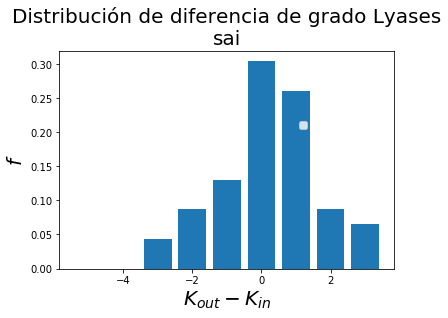

In [6]:
import os

org=[['sai','01100']]
     #['tac','01100']]
     #['eco','01040']]
     #['hsa','01040']]
     #['ptr','01040']]
     #['ath','01040']]
     #['mmu','01040']]
     #['cac','01100'],
     #['cel','01040'],
     #['dme','01040']]
     #['lma','01040']]
     #['sce','01040']]
     #['sfx','01040']]


os.chdir('/home/haku/Documentos/TESIS/PROYECTO/')


for o in org:    
    
    path=os.getcwd()
    os.chdir('ClaseEnzim')       #Cambia la ejecuicon del programa a otra carpeta. 
 
    locals()['ClassEnzima_'+str(o[0])]=pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')
    
    locals()['ClassEnzima_'+str(o[0])]['Enzima']=locals()['ClassEnzima_'+str(o[0])].index
    os.chdir(path)
    
    locals()['ClasGradEnzi_'+str(o[0])]=[]
    for i in locals()['ClassEnzima_'+str(o[0])].values:
        
        locals()['ClasGradEnzi_'+str(o[0])].append( [ i[1] , locals()['G_'+str(o[0])].in_degree(i[2]) , locals()['G_'+str(o[0])].out_degree(i[2]) ] )
  
    df=pd.DataFrame( locals()['ClasGradEnzi_'+str(o[0])], columns=['Clase','grado_in', 'grado_out'])
    df=df.drop_duplicates(subset = 'Clase')
    #df[df['contnodos'] == 13]
    
    
    n=0
    for clase in df['Clase'].values:
        print(clase)
        locals()['D_'+str(clase)]=[] 
        locals()['P_'+str(clase)]=[]
        locals()['X_'+str(clase)]=[]
        for i in locals()['ClasGradEnzi_'+str(o[0])]: 
            if i[0] == clase:
                locals()['D_'+str(clase)].append(i[2]-i[1]) 
                #n=n+1
                #print(n,i[0],clase)

                
               
                
                
        D=locals()['D_'+str(clase)]        
        for i in range(min(D)+1,max(D)+1):
            locals()['P_'+str(clase)].append(D.count(i)/len(D))
            locals()['X_'+str(clase)].append(i)

lbe='Lyases'

plt.bar(locals()['X_'+str(lbe)] , locals()['P_'+str(lbe)] )    

plt.title('Distribución de diferencia de grado '+str(lbe)+'\n'+str(o[0]) ,fontsize=20)
#plt.figure(3,figsize=(100,100))
plt.xlabel(r'$K_{out}-K_{in}$',fontsize=20)
plt.ylabel(r'$f$',fontsize=20)
plt.legend(bbox_to_anchor=(0.7, 0.7), loc='upper left', borderaxespad=0.5)



In [8]:
org=[['sai','01100'],
     ['tac','01100'],
     ['eco','01040'],
     ['hsa','01040'],
     ['ptr','01040'],
     ['ath','01040'],
     ['mmu','01040'],
     ['cac','01100'],
     ['cel','01040'],
     ['dme','01040'],
     ['lma','01040'],
     ['sce','01040'],
     ['sfx','01040']]


os.chdir('/home/haku/Documentos/TESIS/PROYECTO/')

Lyases=[]

for o in org:    
    
    path=os.getcwd()
    os.chdir('ClaseEnzim')       #Cambia la ejecuicon del programa a otra carpeta. 
 
    locals()['ClassEnzima_'+str(o[0])]=pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')
    
    locals()['ClassEnzima_'+str(o[0])]['Enzima']=locals()['ClassEnzima_'+str(o[0])].index
    os.chdir(path)
    
    locals()['ClasGradEnzi_'+str(o[0])]=[]
    for i in locals()['ClassEnzima_'+str(o[0])].values:
        
        locals()['ClasGradEnzi_'+str(o[0])].append( [ i[1] , locals()['G_'+str(o[0])].in_degree(i[2]) , locals()['G_'+str(o[0])].out_degree(i[2]) ] )
  
    df=pd.DataFrame( locals()['ClasGradEnzi_'+str(o[0])], columns=['Clase','grado_in', 'grado_out'])
    
    

    suma_in=0
    suma_out=0
    long=0
    dif=0
    for i in df.values:
        if i[0] == 'Ligases':
                long=1+long
                suma_in=i[1]+suma_in
                suma_out=i[2]+suma_out
                dif=(i[2]-i[1])+dif
                

    Lyases.append([o[0],suma_out/long, suma_in/long , suma_out/long - suma_in/long])
            
Lyases=pd.DataFrame(Lyases, columns=['organismo','grado_out', 'grado_in' , 'dif'])   
Lyases.sort_values(by='dif', ascending=False)

,organismo,grado_out,grado_in,dif
4,ptr,4.216216,3.135135,1.081081
1,tac,2.620690,1.586207,1.034483
3,hsa,4.378378,3.378378,1.000000
6,mmu,4.210526,3.236842,0.973684
8,cel,3.250000,2.375000,0.875000
10,lma,2.619048,1.904762,0.714286
5,ath,2.945946,2.243243,0.702703
9,dme,3.206897,2.689655,0.517241
0,sai,1.875000,1.406250,0.468750
11,sce,2.967742,2.516129,0.451613


In [131]:
X_Transferases

[]

No handles with labels found to put in legend.


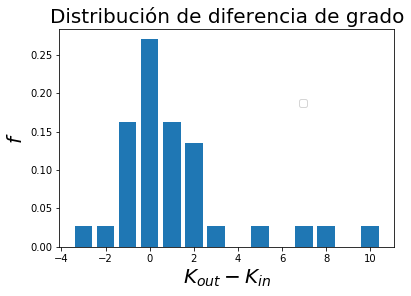

In [158]:
#plt.plot(X_Transferases,P_Transferases, label= 'Ligases' , antialiased= True)
        
plt.bar(X_Ligases,P_Ligases)    

plt.title('Distribución de diferencia de grado',fontsize=20)
#plt.figure(3,figsize=(100,100))
plt.xlabel(r'$K_{out}-K_{in}$',fontsize=20)
plt.ylabel(r'$f$',fontsize=20)
plt.legend(bbox_to_anchor=(0.7, 0.7), loc='upper left', borderaxespad=0.5)



[0.         0.78539816 1.57079633 2.35619449 3.14159265 3.92699082
 4.71238898 5.49778714]


(<a list of 18 Line2D thetagridline objects>,
 <a list of 9 Text thetagridlabel objects>)

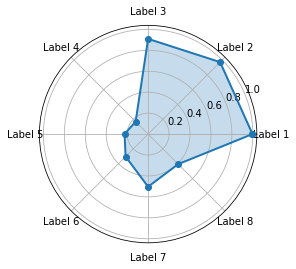

In [205]:

# Creación de un conjunto de datos aleatorio

angles = np.linspace(0, 2 * np.pi, 8, endpoint=False)
print(angles)
values = np.random.random(8)

# Se repite el primer valor para cerrar el gráfico
angles=np.concatenate((angles, [angles[0]]))
values=np.concatenate((values, [values[0]]))
labels=['Label 1', 'Label 2', 'Label 3', 'Label 4', 'Label 5' , 'Label 6' , 'Label 7' , 'Label 8']
# Representación del mapa de calor
plt.polar(angles, values, 'o-', linewidth=2)
plt.fill(angles, values, alpha=0.25)
plt.thetagrids(angles * 180 / np.pi, labels)



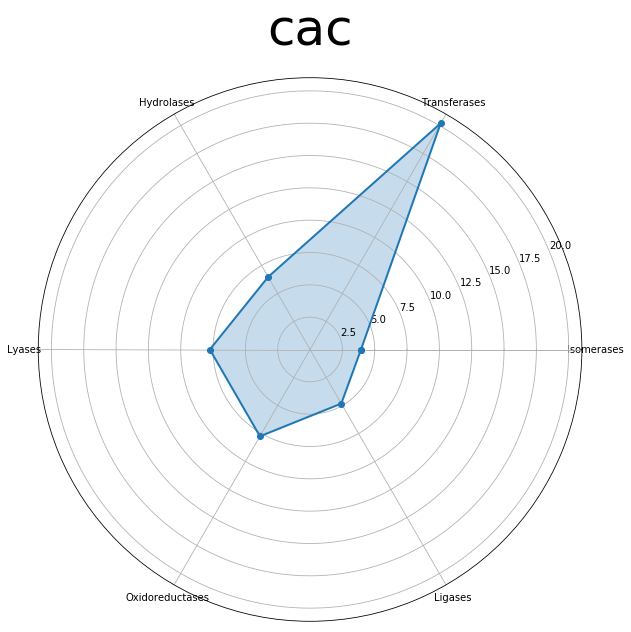

In [12]:


org=[#['sai','01100']]
     #['tac','01100']]
     #['eco','01040']]
     #['hsa','01040']]
     #['ptr','01040'],
     #['ath','01040']]
     #['mmu','01040']]
     ['cac','01100']]
     #['cel','01040']]
     #['dme','01040']]
     #['lma','01040']]
     #['sce','01040']]
     #['sfx','01040']]

#os.chdir('/home/haku/Documentos/TESIS/PROYECTO/')


for o in org:    
    
    path=os.getcwd()
    os.chdir('ClaseEnzim')       #Cambia la ejecuicon del programa a otra carpeta. 
 
    locals()['ClassEnzima_'+str(o[0])]=pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')[['Clase']].values
    
    
    os.chdir(path)
    
 




locals()['Class_'+str(o[0])]=[]
for i in locals()['ClassEnzima_'+str(o[0])]:
    locals()['Class_'+str(o[0])].append(i[0])


locals()['ClassEnzima_'+str(o[0])]=pd.DataFrame(locals()['ClassEnzima_'+str(o[0])], columns=['Clase'])   


cont=[]
for i in locals()['Class_'+str(o[0])]:
    cont.append(locals()['Class_'+str(o[0])].count(i)/len(Class_ath)*100)

locals()['ClassEnzima_'+str(o[0])]['cont']=cont
locals()['ClassEnzima_'+str(o[0])]=locals()['ClassEnzima_'+str(o[0])].drop_duplicates(subset = 'Clase')


classe={}
for i in locals()['ClassEnzima_'+str(o[0])].values:
    classe[i[0]]=i[1]
    
    
labels=['Isomerases', 'Transferases', 'Hydrolases', 'Lyases',
       'Oxidoreductases', 'Ligases']  #, 'Translocases']

angles = np.linspace(0, 2 * np.pi, 6, endpoint=False)
values = []
for i in labels:
    values.append(classe[i])
    
# Se repite el primer valor para cerrar el gráfico
angles=np.concatenate((angles, [angles[0]]))
values=np.concatenate((values, [values[0]]))

# Representación del mapa de calor
plt.figure(figsize=(10,10))
plt.polar(angles, values, 'o-', linewidth=2)
plt.fill(angles, values, alpha=0.25)
plt.thetagrids(angles * 180 / np.pi, labels)    

plt.title(str(o[0]), size=50)
plt.savefig(str(o[0]))
plt.show()
 




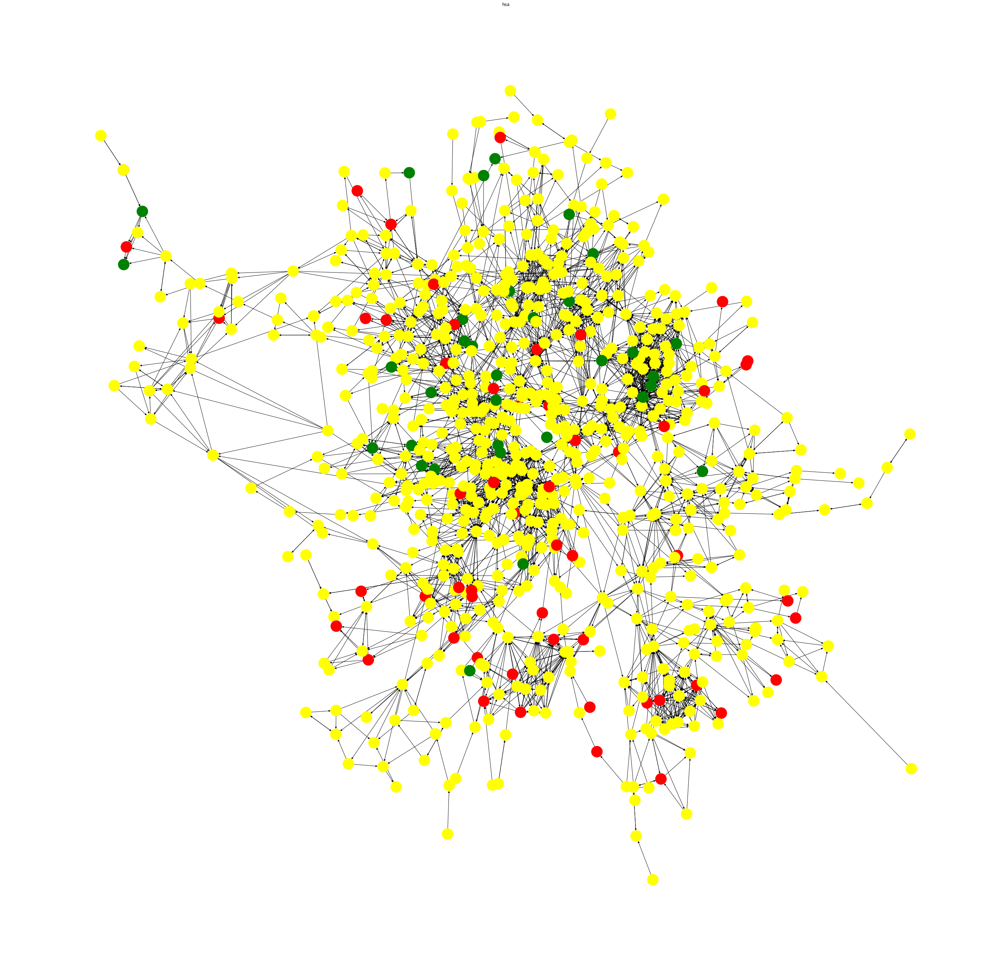

In [74]:

org=[#['sai','01100']]
     #['tac','01100']]
     #['eco','01040']]
     ['hsa','01040']]
     #['ptr','01040'],
     #['ath','01040']]
     #['mmu','01040']]
     #['cac','01100']]
     #['cel','01040']]
     #['dme','01040']]
     #['lma','01040']]
     #['sce','01040']]
     #['sfx','01040']]

#os.chdir('/home/haku/Documentos/TESIS/PROYECTO/')


for o in org:    
    
    path=os.getcwd()
    os.chdir('ClaseEnzim')       #Cambia la ejecuicon del programa a otra carpeta. 
 
    locals()['ClassEnzima_'+str(o[0])]=pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')    
    
    os.chdir(path)
    
    


plt.figure(3,figsize=(50,50))

color=[]
for i in locals()['ClassEnzima_'+str(o[0])].values:
    if i[1] == 'No informacion':
        color.append('red')     
    
    if i[1] == 'Ligases':
        color.append('green')
    else:
        color.append('yellow')
        
         
        
       
plt.title(o[0])
#nx.draw_circular(locals()['G_'+str(o[0])],node_color=color) #, with_labels=True)
#plt.savefig('tac')

nx.draw_kamada_kawai(locals()['G_'+str(o[0])],font_size=15,node_size=1000,node_color=color, with_labels=False)

In [64]:
org=[['sai','01100'],
     ['tac','01100'],
     ['eco','01040'],
     ['hsa','01040'],
     ['ptr','01040'],
     ['ath','01040'],
     ['mmu','01040'],
     ['cac','01100'],
     #['cel','01040'],
     ['dme','01040'],
     ['lma','01040'],
     ['sce','01040'],
     ['sfx','01040']]

#os.chdir('/home/haku/Documentos/TESIS/PROYECTO/')

Entropy=[]
for o in org:    
    
    path=os.getcwd()
    os.chdir('ClaseEnzim')       #Cambia la ejecuicon del programa a otra carpeta. 
 
    locals()['ClassEnzima_'+str(o[0])]=pd.read_csv('ClaseEnzima_'+o[0]+'.csv',index_col=0, delimiter=';')    
    
    os.chdir(path)

    
    locals()['ClassEnzima_'+str(o[0])]['Enzima']=locals()['ClassEnzima_'+str(o[0])].index   

    dicEnz={}
    for i in  locals()['ClassEnzima_'+str(o[0])].values:
        dicEnz[i[2]]= i[1]

    locals()['Edges_'+str(o[0])]=[] 
    locals()['EDges_'+str(o[0])]=[]
    for i in locals()['G_'+str(o[0])].edges:
        locals()['Edges_'+str(o[0])].append( dicEnz[i[0]] + ' ' + dicEnz[i[1]] )
        locals()['EDges_'+str(o[0])].append( [ dicEnz[i[0]] , dicEnz[i[1]] ] )
        
    cont=[]    
    for i in locals()['Edges_'+str(o[0])]:
        cont.append(locals()['Edges_'+str(o[0])].count(i))
    
    df=pd.DataFrame(locals()['Edges_'+str(o[0])], columns=['nombre'])
    
    
    
    df['cont']=cont 

    long=len(df.values)

    df=df.drop_duplicates(subset = 'nombre')

    H=0
    for i in df.values:
        p=i[1]/long
        h=p*np.log2(p)
        H=h+H    
    Entropy.append([o[0],-H])
    
Entropy=pd.DataFrame(Entropy, columns=['Organismos' , 'Entropia'])    


In [59]:
Entropy.sort_values(by='Entropia', ascending=False)

,Organismos,Entropia
5,ath,4.788737
2,eco,4.778849
11,sfx,4.694181
0,sai,4.690214
9,lma,4.663908
8,dme,4.612924
7,cac,4.611710
10,sce,4.585963
3,hsa,4.539316
6,mmu,4.526112


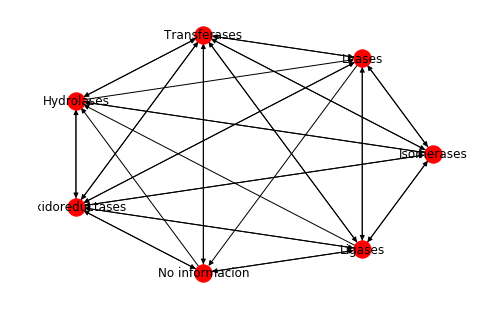

In [75]:
G=nx.DiGraph()
G.add_edges_from(EDges_sai)
#for i in EDges_sai:
#    G.add_edge(i)

nx.draw_circular(G, with_labels=True)
